# Segmentation map으로 도로 이미지 만들기

2014년 GAN(Generative Adversarial Networks)이 세상에 나타난 이후, Computer Vision 및 다양한 분야에서 많은 관심을 받아 활발하게 응용되면서 빠르게 발전해왔다.  
오늘은 이미지 생성 모델로 사용되는 일반적인 GAN에 조건을 부여하여 내가 원하는 유형의 이미지를 생성해 낼 수 있도록 하는 방법에 대해 알아보겠다.

## 조건 없는 생성모델(Unconditional Generative Model), GAN

우리는 GAN을 이용해 MNIST, CIFAR-10 등의 데이터셋을 학습하고 생성해 본적이 있다.
성공적으로 학습되었다면, 아래와 같이 학습에 사용한 실제 손글씨 이미지와 매우 유사한 손글씨 이미지를 생성했을 것이다.

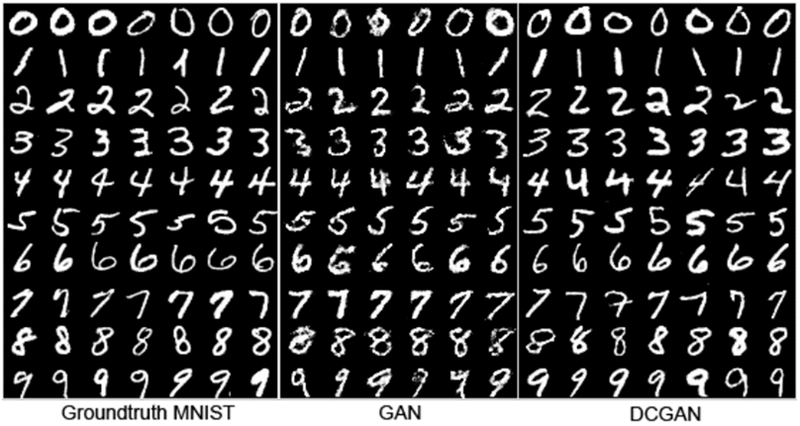

여기서 한 가지 생각해 보자.

예를 들어, "7"이라는 이미지를 만들고자 MNIST 데이터셋을 이용해 GAN을 열심히 학습시켰다.  
학습이 완료된 모델을 이용해 "7"이라 쓰여있는 이미지를 얻기 위해 어떤 방법을 이용해야 할까?  
여기서 할 수 있는 방법으로는 그저 다양한 노이즈를 계속 입력으로 넣어보고 "7"이라는 숫자 이미지가 생성되길 기다리는 것이다.  
운이 좋다면 한 번에 만들 수 있겠지만 운이 없다면 100개가 넘는 이미지를 생성해도 7이 나오지 않을 수 있다.  
또한 혹시라도 "7" 이미지를 수만 개 만들어야 한다면, 새로운 노이즈 입력을 몇 번이나 넣어야 할지 상상만 해도 끔찍하다.

이렇듯 잘 학습된 GAN을 이용해 실제 이미지를 생성할 때 조금 답답한 점이 하나 있다면, 바로 내가 원하는 종류의 이미지를 바로 생성해 내지 못한다는 것이다.  
다시 말해서 일반적인 GAN과 같은 unconditioned generative model은 내가 생성하고자 하는 데이터에 대해 제어하기 힘들었다.  

우리가 원하는 이미지를 바로바로 생성해 내기 위해서는 어떤 방법을 이용해야 할까? GAN이라는 생성 모델에 내가 원하는 이미지를 만들기 위한 특정 조건을 줄 수는 없을까?  
기약 없이 "7"이라 쓰인 이미지가 생성되길 기다릴 순 없기 때문이다.

## 조건 있는 생성모델(Conditional Generative Model), cGAN

Conditional Generative Adversarial Nets (cGAN)은 내가 원하는 종류의 이미지를 생성하고자 할 때 GAN이 가진 생성 과정의 불편함을 해소하여, 내가 원하는 종류의 이미지를 생성할 수 있도록 고안된 방법이다.  
GAN을 잘 이해하고 있다면 이 방법(cGAN)은 전혀 어렵지 않다.

### GAN의 목적 함수  
먼저 GAN에 대해 간단히 복습해 보자. GAN 구조는 Generator 및 Discriminator라 불리는 두 신경망이 minimax game을 통해 서로 경쟁하며 발전한다. 이를 아래와 같은 식으로 나타낼 수 있으며 Generator는 이 식을 최소화하려, Discriminator는 이 식을 최대화하려 학습한다.

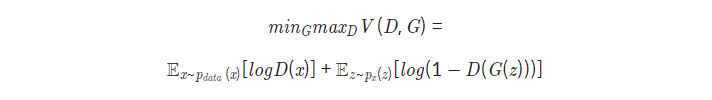

위 식에서 z는 임의 노이즈를, D와 G는 각각 Discriminator 및 Generator를 의미한다.

먼저 D의 입장에서 식을 바라보자.  
실제 이미지를 1, 가짜 이미지를 0으로 두었을 때, D는 이 식을 최대화해야 하며, 우변의 + 를 기준으로 양쪽의 항(logD(x)) 및 log(1−D(G(z)))이 모두 최대가 되게 해야 한다.  
이를 위해서 두 개의 log가 1이 되게 해야 한다.  
D(x)는 1이 되도록, D(G(z))는 0이 되도록 해야 한다.  
다시 말하면, 진짜 데이터(x)를 진짜로, 가짜 데이터 G(z))를 가짜로 정확히 예측하도록 학습한다는 뜻이다.

이번엔 G의 입장에서 식을 바라보자. D와 반대로 G는 위 식을 최소화해야 하고 위 수식에서는 마지막 항 log(1−D(G(z)))만을 최소화하면 된다.(우변의 첫 번째 항은 G와 관련이 없다).
이를 최소화한다는 것은 log 내부가 0이 되도록 해야 함을 뜻하며, D(G(z))가 1이 되도록 한다는 말과 같다.
즉, G는 z를 입력받아 생성한 데이터 G(z)를 D가 진짜 데이터라고 예측할 만큼 진짜 같은 가짜 데이터를 만들도록 학습한다는 뜻이다.

### cGAN의 목적 함수  
GAN과 비교하며 알아볼 cGAN의 목적함수는 아래와 같다.

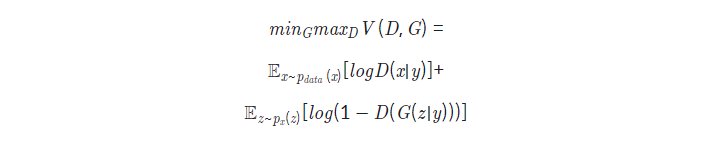

GAN과 cGAN의 목적함수를 자세히 비교해 보고 아래 퀴즈를 풀어보자.

Q: cGAN의 목적함수는 GAN의 목적함수와 비교하여 어떤 부분이 바뀌었을까?  
A: D(x)와 G(z)가 각각 D(x∣y), G(z∣y)로 바뀌었다.

위에서 GAN의 목적함수를 이해했고, GAN의 목적함수와 비교해 위 식에서 달라진 부분을 잘 찾아냈다면 크게 어렵지 않다.  
위 식에서 바뀐 부분은 우변의 + 를 기준으로 양쪽 항에 y가 추가되었다는 것뿐이다.  
G와 D의 입력에 특정 조건을 나타내는 정보인 y를 같이 입력한다는 것이다.  
이외에는 GAN의 목적함수와 동일하므로 각각 y를 추가로 입력받아 G의 입장에서 식을 최소화하고, D의 입장에서 식을 최대화하도록 학습한다.

여기서 함께 입력하는 y는 어떠한 정보여도 상관없으며, MNIST 데이터셋을 학습시키는 경우 y는 0~9 까지의 label 정보가 된다.
Generator가 어떠한 노이즈 z를 입력받았을 때, 특정 조건 y가 함께 입력되기 때문에, y를 통해 z를 어떠한 이미지로 만들어야 할지에 대한 방향을 제어할 수 있게 된다.
조금 다르게 표현하면 y가 임의 노이즈 입력인 z의 가이드라고 할 수 있겠다.

### 그림으로 이해하기
이번에는 GAN과 cGAN의 Feed forward 과정을 그림으로 비교해 보자.

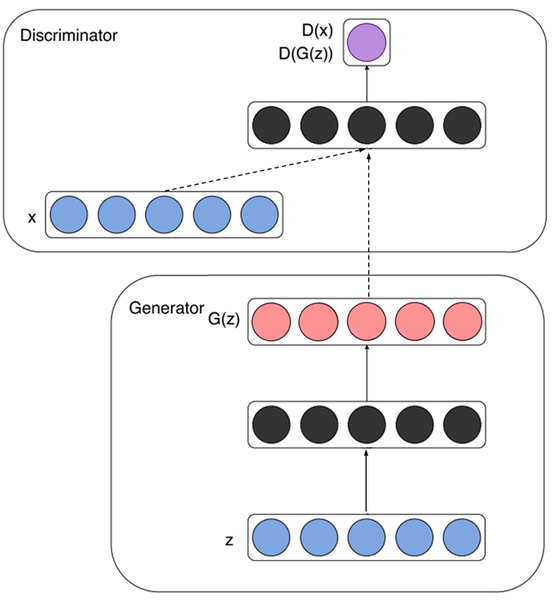

GAN의 학습 과정은 위 그림과 같다.

#### Generator
노이즈 z(파란색)가 입력되고 특정 representation(검정색)으로 변환된 후 가짜 데이터 G(z) (빨간색)를 생성해 낸다. 
#### Discriminator
실제 데이터 x와 Generator가 생성한 가짜 데이터 G(z)를 각각 입력받아 D(x) 및 D(G(z)) (보라색)를 계산하여 진짜와 가짜를 식별해 낸다.

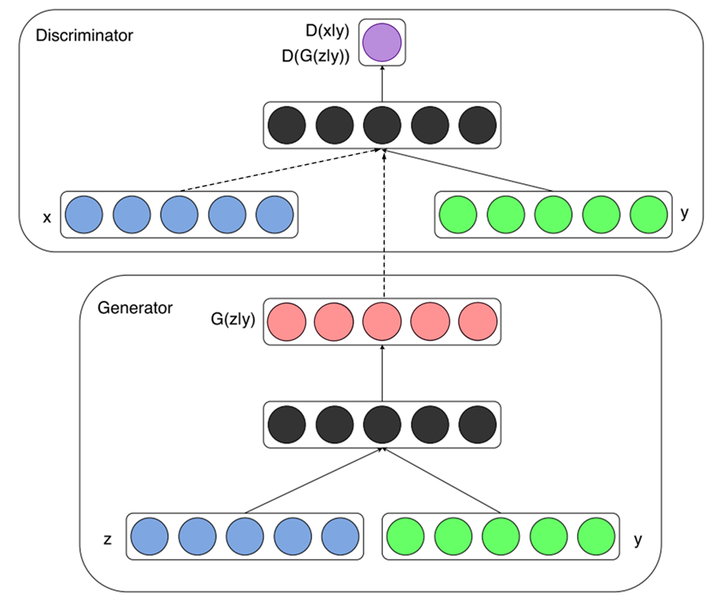

이전 목적함수에서 확인했듯이, cGAN에서 바뀐 부분은 y라는 정보가 함께 입력된다는 것이다.

● Generator  
노이즈 z(파란색)와 추가 정보 y(녹색)을 함께 입력받아 Generator 내부에서 결합되어 representation(검정색)으로 변환되며 가짜 데이터 G(z∣y)를 생성한다. MNIST나 CIFAR-10 등의 데이터셋에 대해 학습시키는 경우 y는 레이블 정보이며, 일반적으로 one-hot 벡터를 입력으로 넣는다.

● Discriminator  
실제 데이터 x와 Generator가 생성한 가짜 데이터 G(z∣y)를 각각 입력받으며, 마찬가지로 y정보가 각각 함께 입력되어 진짜와 가짜를 식별한다. MNIST나 CIFAR-10 등의 데이터셋에 대해 학습시키는 경우 실제 데이터 x와 y는 알맞은 한 쌍("7"이라 쓰인 이미지의 경우 레이블도 7)을 이뤄야 하며, 마찬가지로 Generator에 입력된 y와 Discriminator에 입력되는 y는 동일한 레이블을 나타내야 한다.

위 내용에 큰 어려움이 없었다면 cGAN에 대해 어느 정도 이해했을것으로 예상된다.

GAN과 cGAN을 간단하게 구현하고 비교하는 부분은 생략한다.

## GAN의 입력에 이미지를 넣는다면? Pix2Pix

지금까지 cGAN에 대해 알아보고 실험해 보면서, 작은 조건만으로 우리가 원하는 클래스의 이미지를 생성할 수 있음을 확인했다. 만약 입력 자체가 조건이 된다면 어떨까? cGAN과 같이 클래스 레이블 등의 조건을 함께 입력하는 것이 아니라, 조금 더 자세하게 내가 원하는 이미지를 얻기 위해 이미지를 조건으로 줄 수 없을까? 이번에 소개하는 Pix2Pix는 기존 노이즈 입력을 이미지로 변환하는 일반적인 GAN이 아니라, 이미지를 입력으로 하여 원하는 다른 형태의 이미지로 변환시킬 수 있는 GAN 모델이다.

Pix2Pix를 제안한 논문의 제목은 [Image-to-Image Translation with Conditional Adversarial Networks][1] 로 하고자 하는 바가 제목에 그대로 담겨 있다.
Conditional Adversarial Networks로 Image-to-Image Translation을 수행한다는 뜻이다. Conditional Adversarial Networks는 이전까지 알아봤던 cGAN과 같은 구조를 말하는 것인데, Image-to-Image Translation 이란 단어는 무엇을 뜻하는 걸까? 아래 Pix2Pix 논문에서 수행한 결과를 먼저 살펴보자.

이후 표기되는 이미지에 대한 출처가 명시되지 않은 경우, Pix2Pix 논문에서 가져왔음을 미리 알려드린다.

[1]:https://arxiv.org/pdf/1611.07004.pdf

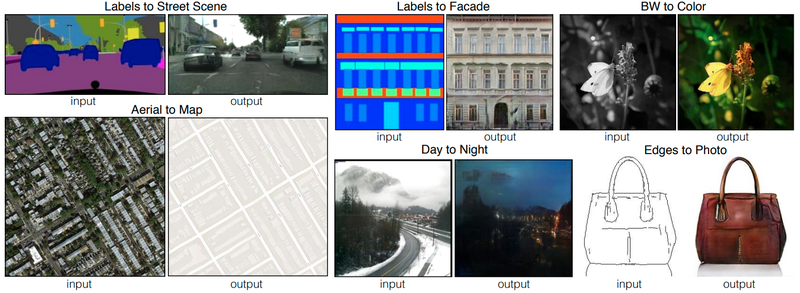

Image-to-Image Translation은 말 그대로 이미지 간 변환을 말한다.  
위 결과의 첫 번째 Labels to Street Scene 이미지는 픽셀 별로 레이블 정보만 존재하는 segmentation map을 입력으로 실제 거리 사진을 생성해 내었고, 이 외에 흑백 사진을 컬러로 변환하거나, 낮에 찍은 사진을 밤에 찍은 사진으로 변환하거나, 가방 스케치를 이용해 채색된 가방을 만들기도 한다.

한 이미지의 픽셀에서 다른 이미지의 픽셀로(pixel to pixel) 변환한다는 뜻에서 Pix2Pix라는 이름으로 불린다. 이 구조는 최근 활발하게 연구 및 응용되는 GAN 기반의 Image-to-Image Translation 작업에서 가장 기초가 되는 연구이다.

노이즈와 레이블 정보를 함께 입력했던 cGAN은 fully-connected 레이어를 연속적으로 쌓아 만들었지만, 이미지 변환이 목적인 Pix2Pix는 이미지를 다루는데 효율적인 convolution 레이어를 활용한다. GAN 구조를 기반으로 하기 때문에 크게 Generator와 Discriminator 두 가지 구성 요소로 이루어 진다. 아래에서 자세히 알아보겠다.

## Pix2Pix (Generator)
Generator는 어떠한 이미지를 입력받아 변환된 이미지를 출력하기 위해 사용된다. 여기서 입력 이미지와 변환된 이미지의 크기는 동일해야 하며, 이러한 문제에서 흔히 사용되는 구조는 아래 그림과 같은 Encoder-Decoder 구조이다.

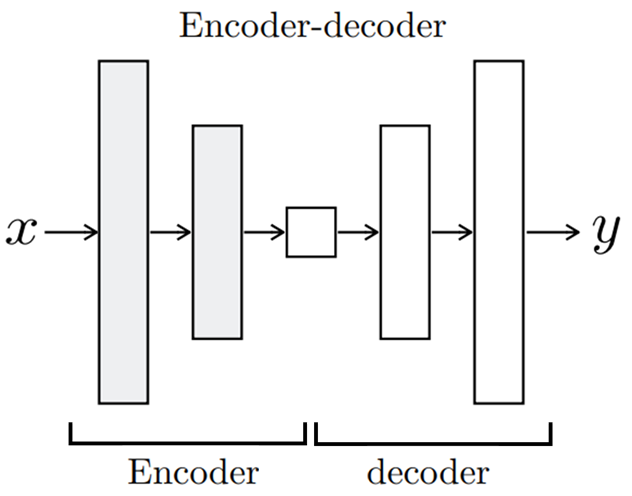

Encoder에서 입력 이미지(x)를 받으면 단계적으로 이미지를 down-sampling 하면서 입력 이미지의 중요한 representation을 학습한다. Decoder에서는 이를 이용해 반대로 다시 이미지를 up-sampling하여 입력 이미지와 동일한 크기의 변환된 이미지(y)를 생성해낸다. 이러한 과정은 모두 convolution 레이어로 진행되며, 레이어 내의 수많은 파라미터를 학습하여 잘 변환된 이미지를 얻도록 한다. 여기서 한 가지 짚고 넘어갈 부분은, Encoder의 최종 출력은 위 그림 중간에 위치한 가장 작은 사각형이며, bottleneck 이라고도 불리는 이 부분은 입력 이미지(x)의 가장 중요한 특징만을 담고 있다.

과연 이것도 중요하지만 작은 특징이 변환된 이미지(y)를 생성하는데 충분한 정보를 제공할까? 이와 같은 점을 보완하기 위해 논문에서는 Generator 구조를 하나 더 제안한다.  
아래 그림과 같은 U-Net 구조이다.

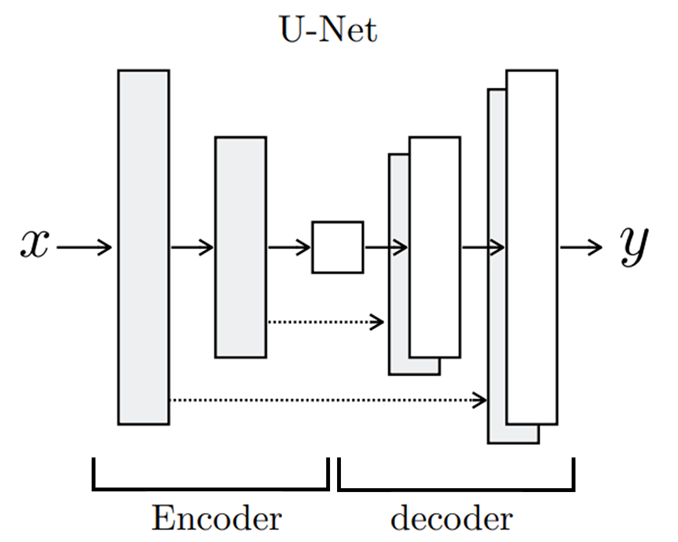

위에서 살펴본 단순한 Encoder-Decoder로 구성된 Generator와 다른 점은, 각 레이어마다 Encoder와 Decoder가 연결(skip connection)되어 있다는 것이다. Decoder가 변환된 이미지를 더 잘 생성하도록 Encoder로부터 더 많은 추가 정보를 이용하는 방법이며, 이러한 U-Net 구조의 Generator를 사용해 아래와 같이 단순한 Encoder-Decoder 구조의 Generator를 사용한 결과에 비해 비교적 선명한 결과를 얻을 수 있었다.

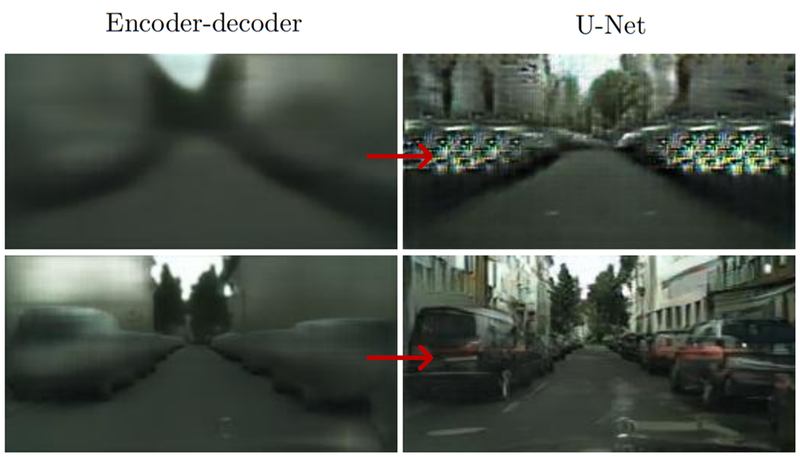

여기서 U-Net은 이전에 segmentation 작업을 위해 제안된 구조이다. U-Net에 대한 자세한 사항은 이번 노드의 학습 범위를 벗어나므로 아래에 잘 정리된 자료를 첨부한다.

● [U-Net 논문 리뷰][1]

[1]:https://medium.com/@msmapark2/u-net-%EB%85%BC%EB%AC%B8-%EB%A6%AC%EB%B7%B0-u-net-convolutional-networks-for-biomedical-image-segmentation-456d6901b28a

## Pix2Pix (Loss Function)
예상컨대 위 Generator 구조를 보면서 한 번쯤 생각해 봤을 것 같은 사항으로는 "Generator만으로도 이미지 변환이 가능하지 않을까?"이다.

Q: Generator만을 사용한 이미지 변환, 가능할까?  
A: 물론, 가능하다. AutoEncoder 형태의 접근은 Generator만으로 이미지 변환을 진행한다.

당연하게도 변환하고자 하는 이미지를 Encoder에 입력하여 Decoder의 출력으로 변환된 이미지를 얻을 수 있다. 출력된 이미지와 실제 이미지의 차이로 L2(MSE), L1(MAE) 같은 손실을 계산한 후 이를 역전파하여 네트워크를 학습시키면 되겠다. 이미지 변환이 가능은 하지만 문제는 변환된 이미지의 품질이다. 아래 사진의 L1이라 써있는 결과가 Generator만을 사용해 변환된 이미지와 실제 이미지 사이의 L1 손실을 이용해 만들어낸 결과이다.

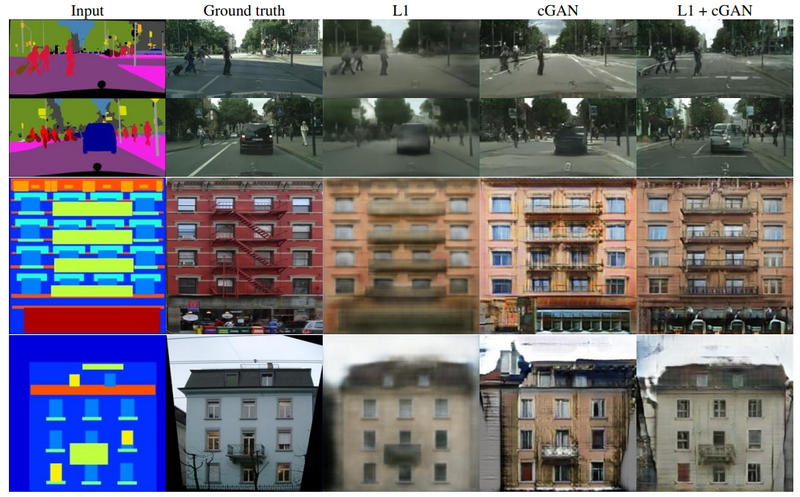

L1 이라 쓰여있는 Generator만으로 생성된 결과는 매우 흐릿하다. 이미지를 변환하는데 L1(MAE)이나 L2(MSE) 손실만을 이용해서 학습하는 경우 이렇게 결과가 흐릿해지는 경향이 있다. Generator가 단순히 이미지의 평균적인 손실만을 줄이고자 파라미터를 학습하기 때문에 이러한 현상이 불가피하다.

반면 위 그림의 cGAN이라 쓰여진 GAN 기반의 학습 방법은 비교적 훨씬 더 세밀한 정보를 잘 표현하고 있다. Discriminator를 잘 속이려면 Generator가 (Ground truth라고 쓰여진 이미지같이) 진짜 같은 이미지를 만들어야 하기 때문이다. 논문에서는 L1손실과 GAN 손실을 같이 사용하면 더욱 더 좋은 결과를 얻을 수 있다고 한다(위 그림의 L1+cGAN).

## Pix2Pix (Discriminator)

위 결과에서 보듯 실제 같은 이미지를 얻기 위해서는 GAN의 학습 방법을 이용해야 하며, 위에서 설명한 Generator를 발전시킬 서포터이자 경쟁자, Discriminator가 필요하다. 이전에 다뤘던 DCGAN의 Discriminator 기억해보자. 아래 그림은 DCGAN의 Discriminator를 나타낸다.

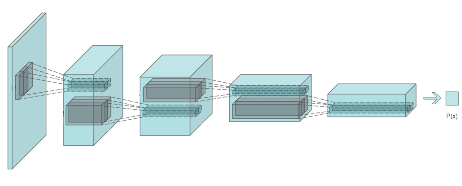

DCGAN의 Discriminator는 생성된 가짜 이미지 혹은 진짜 이미지를 하나씩 입력받아 convolution 레이어를 이용해 점점 크기를 줄여나가면서, 최종적으로 하나의 이미지에 대해 하나의 확률 값을 출력했다. Pix2Pix는 이 과정에서 의문을 갖는다.

하나의 전체 이미지에 대해 하나의 확률 값만을 도출하는 것이 진짜 혹은 가짜를 판별하는 데 좋은 것일까?

Pix2Pix는 이러한 의문점을 가지고 아래 그림과 같은 조금 다른 방식의 Discriminator를 사용한다.

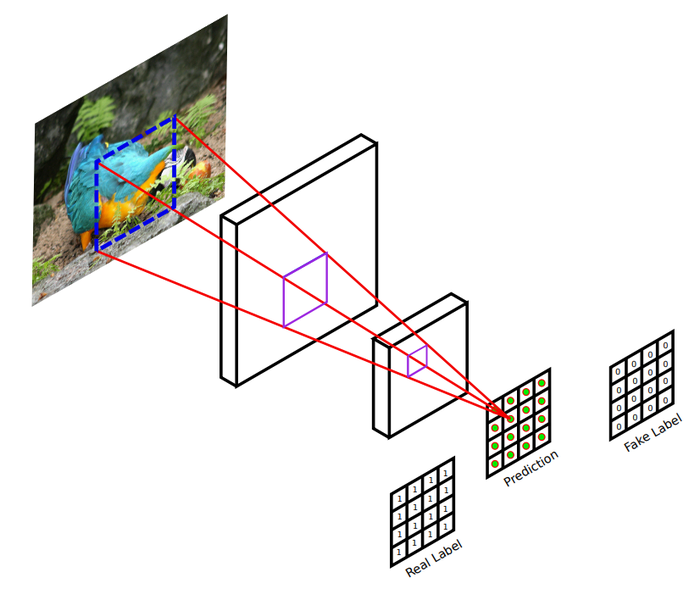

위 그림은 Pix2Pix에서 사용되는 Discriminator를 간략하게 나타낸다. 하나의 이미지가 Discriminator의 입력으로 들어오면, convolution 레이어를 거쳐 확률 값을 나타내는 최종 결과를 생성하는데, 그 결과는 하나의 값이 아닌 여러 개의 값을 갖는다(위 그림의 Prediction은 16개의 값을 가지고 있다). 위 그림에서 입력 이미지의 파란색 점선은 여러 개의 출력 중 하나의 출력을 계산하기 위한 입력 이미지의 receptive field 영역을 나타내고 있으며, 전체 영역을 다 보는 것이 아닌 일부 영역(파란색 점선)에 대해서만 진짜/가짜를 판별하는 하나의 확률 값을 도출한다는 것이다.

이런 방식으로 서로 다른 영역에 대해 진짜/가짜를 나타내는 여러 개의 확률 값을 계산할 수 있으며 이 값을 평균하여 최종 Discriminator의 출력을 생성한다. 이러한 방법은 이미지의 일부 영역(patch)을 이용한다고 하여 PatchGAN이라고 불린다. 일반적으로 이미지에서 거리가 먼 두 픽셀은 서로 연관성이 거의 없기 때문에 특정 크기를 가진 일부 영역에 대해서 세부적으로 진짜/가짜를 판별하는 것이 Generator로 하여금 더 진짜 같은 이미지를 만들도록 하는 방법이다.

아래 그림은 (위 그림의 파란색 점선 같은) 판별 영역을 다양한 크기로 실험하여 그 결과를 보여준다.

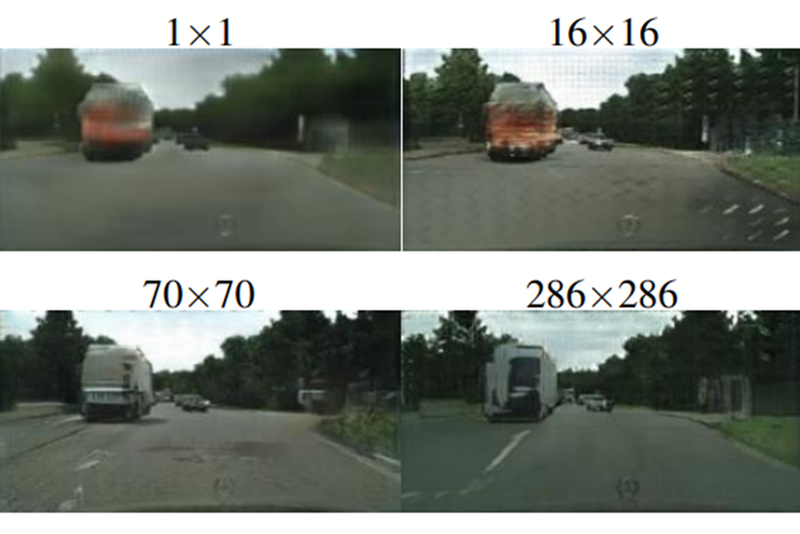

마지막에 보이는 286x286이라 적힌 이미지는 DCGAN의 Discriminator와 같이 전체 이미지에 대해 하나의 확률 값을 출력하여 진짜/가짜를 판별하도록 학습한 결과이다(입력 이미지 크기가 286x286 이다). 70x70 이미지는 Discriminator입력 이미지에서 70x70 크기를 갖는 일부 영역에 대해서 하나의 확률 값을 출력한 것이며, 16x16, 1x1로 갈수록 더 작은 영역을 보고 각각의 확률 값을 계산하므로 Discriminator의 출력값의 개수가 더 많다. 위 4개의 이미지를 살펴보면, 너무 작은 patch를 사용한 결과(1x1, 16x16)는 품질이 좋지 않으며, 70x70 patch를 이용한 결과가 전체 이미지를 사용한 결과(286x286)보다 조금 더 사실적인 이미지를 생성하므로 PatchGAN의 사용이 성공적이라고 볼 수 있을 것 같다.

지금까지 Pix2Pix의 Generator와 Discriminator, Loss function을 구성하는 기본 아이디어들에 대해서 간략하게 알아봤다. 다음 단계부터는 Pix2Pix를 구현하면서 더 자세히 이해해 보자.

## 폴더 생성

In [1]:
# cd  ~/aiffel/conditional_generation/project
# unzip cityscapes.zip

## 라이브러리, 데이터 불러오기

In [2]:
import os

data_path = os.getenv('HOME')+'/aiffel/conditional_generation/project/cityscapes/train/'
print("number of train examples :", len(os.listdir(data_path)))

number of train examples : 1000


1000개의 이미지가 있음을 확인했다.

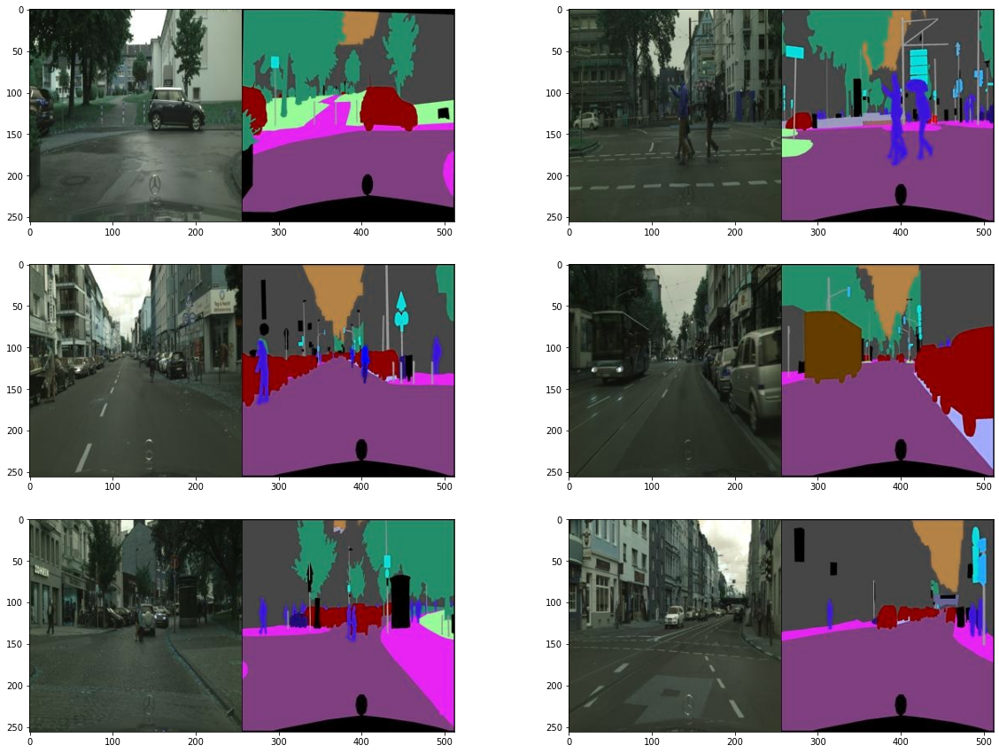

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

코드를 이용해 각각의 이미지들이 어떻게 생겼는지 확인해 봤다. 학습용 데이터셋에서 임의로 6장을 선택하여 시각화했다.

In [4]:
f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


이미지를 하나 열어 아래와 같이 크기를 확인해 보았다. (256, 512, 3)으로 확인되었다. 모델 학습에 사용할 데이터를 (256, 256, 3) 크기의 2개 이미지로 분할하여 사용하면 될 것 같다.

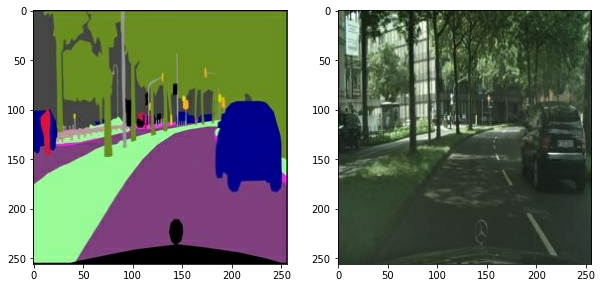

In [5]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    sketch = img[:, w:, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, :w, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)

f = data_path + os.listdir(data_path)[1]
sketch, colored = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

코드로 이미지를 나누어 봤다. 위와 같이 두 개 이미지로 나누었다. 첫 번째 스케치를 다음 단계에서 구성할 Pix2Pix 모델에 입력하여 두 번째 그림과 같은 채색된 이미지를 생성하는 것이 이번 단계의 목표이다.

앞서 살펴봤듯이 학습에 사용할 수 있는 데이터의 수는 약 1000개뿐이다. 학습에 사용하는 데이터의 다양성을 높이기 위해 아래 코드와 같이 여러 augmentation 방법을 적용해 보겠다.

## augmentation

In [6]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]   

print("✅")

✅


apply_augmentation 함수는 스케치 및 채색된 2개 이미지를 입력으로 받아 여러 가지 연산을 두 이미지에 동일하게 적용한다.
입력된 이미지에 어떠한 과정이 적용되는지 위 코드를 보면서 아래 퀴즈를 풀어보자.

Q: 위에서 정의한 apply_augmentation 함수에 두 이미지가 입력되면 어떠한 과정을 거치는지 순서대로 적어보자.

A: 
1. 두 이미지가 채널 축으로 연결됩니다. (tf.concat). 두 이미지가 각각 3채널인 경우 6채널이 된다.
2. 1.의 결과에 각 50% 확률로 Refection padding 또는 constant padding이 30픽셀의 pad width 만큼 적용된다. (tf.pad)
3. 2.의 결과에서 (256,256,6) 크기를 가진 이미지를 임의로 잘라낸다. (tf.image.random_crop)
4. 3.의 결과를 50% 확률로 가로로 뒤집는다. (tf.image.random_flip_left_right)
5. 4.의 결과를 50% 확률로 세로로 뒤집는다. (tf.image.random_flip_up_down)
6. 5.의 결과를 50% 확률로 회전시킨다. (tf.image.rot90)

위와 같이 구성한 함수를 데이터에 적용해 시각화 해보자.

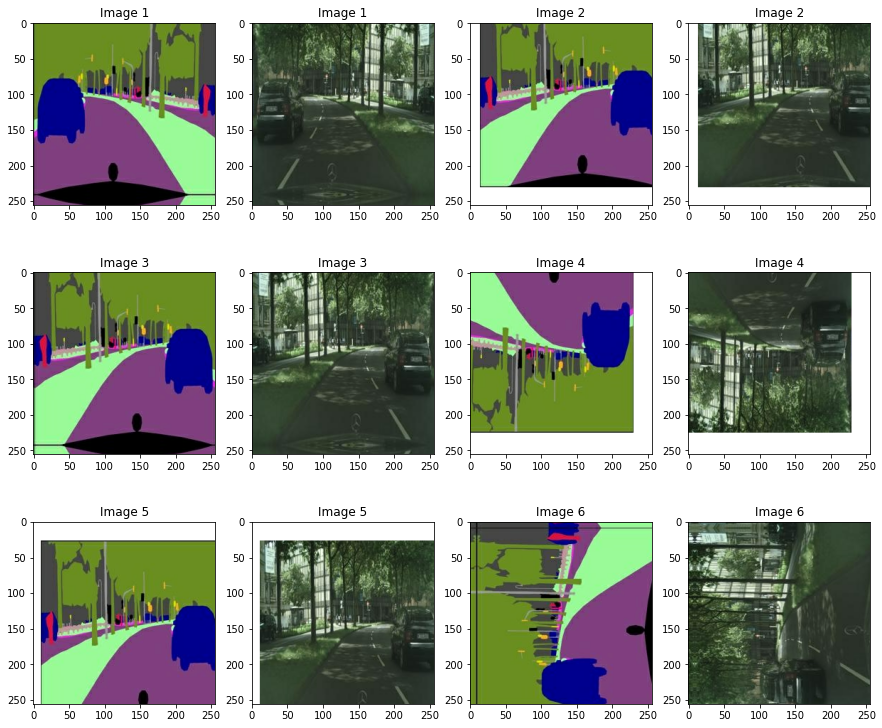

In [7]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

매우 다양한 이미지가 생성된다. 여기서 사용한 augmentation 방법 외에 더 많은 방법을 활용한다면 더욱더 다양한 데이터셋을 만들어 좋은 일반화 결과를 기대해 볼 수 있다.

마지막으로 위 과정들을 학습 데이터에 적용하며, 잘 적용되었는지 하나의 이미지만 시각화하여 확인해 보겠다.

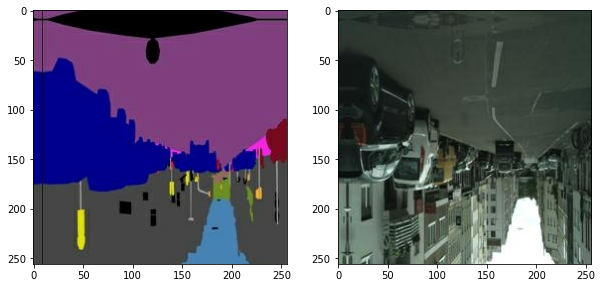

In [8]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

잘 적용이 된 것을 확인할 수 있다.

## Generator 구성하기

이제부터 본격적으로 Pix2Pix 구조를 구현한다. 앞서 cGAN 구현과 같이 Tensorflow의 Subclassing 방법을 이용해 모델을 만들겠다.

### Generator의 구성요소 알아보기 
먼저, pix2pix 논문에서 Generator를 구성하는데 필요한 정보를 아래에 가져왔다. 한번 읽어보고 아래 질문에 답해보자.

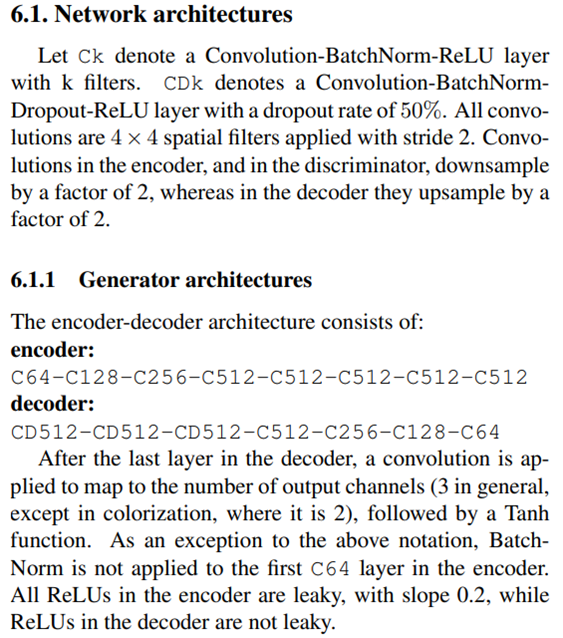

Q: 논문에서 표기한 encoder의 "C64"는 어떠한 하이퍼파라미터를 가진 레이어들의 조합을 나타낼까?
    
A: 64개의 4x4 필터에 stride 2를 적용한 Convolution → 0.2 slope의 LeakyReLU (위 논문의 아래 단락에 BatchNorm을 사용하지 않는다고 쓰여 있다)

Q: 논문에서 표기한 decoder의 "CD512"는 어떠한 하이퍼파라미터를 가진 레이어들의 조합을 나타낼까?

A: 512개의 4x4 필터에 stride 2를 적용한 (Transposed) Convolution → BatchNorm → 50% Dropout → ReLU

위 두 개의 질문에 잘 답했다면, Generator를 구성하는데 필요한 레이어들은 대략적으로 숙지했으리라 생각된다.  
이번에는 아래와 같이 보기 쉽게 표현한 그림을 통해 Generator의 전체 구조를 머릿속에 조금 더 자세히 그려보자.

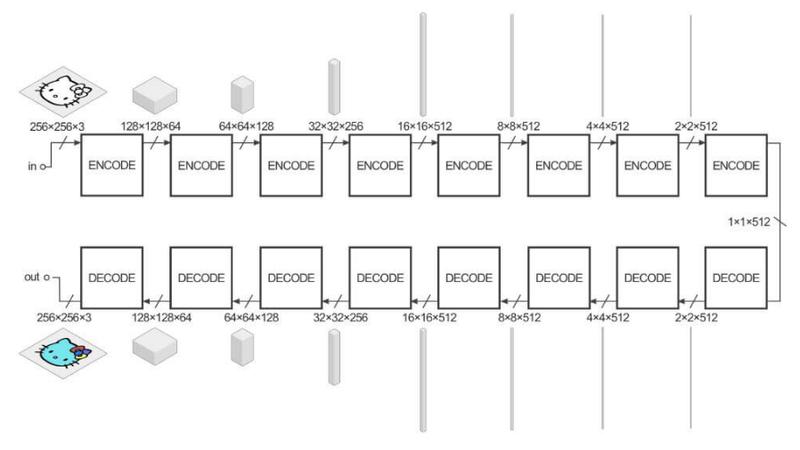

위 그림에서 ENCODE 또는 DECODE라고 쓰인 각각의 블록을 기준으로 양쪽에 쓰인 입출력 크기에 집중하자.  
"in"이라고 쓰여진 입력 부분부터 윗줄의 화살표를 쭉 따라가면 계산된 결과의 (width, height) 크기가 점점 절반씩 줄어들며 최종적으로 (1,1)이 되고, 채널의 수는 512까지 늘어나는 것을 확인할 수 있다.  
처음 입력부터 시작해서 (1,1,512) 크기를 출력하는 곳까지가 Encoder 부분이다.

이어서 아랫줄 화살표를 따라가면 (width, height) 크기가 점점 두 배로 늘어나 다시 (256, 256) 크기가 되고, 채널의 수는 점점 줄어들어 처음 입력과 같이 3채널이 된다. (1,1,512)를 입력으로 최종 출력까지의 연산들이 Decoder 부분이다.

## Generator 구현하기

위 정보들을 토대로 여러분의 머릿속에 희미하게 그려진 Generator의 Encoder 부분을 구현하겠다.  
먼저 위 논문에서 "C64", "C128" 등으로 쓰여진 것과 같이 "Convolution → BatchNorm → LeakyReLU"의 3개 레이어로 구성된 기본적인 블록을 아래와 같이 하나의 레이어로 만들었다.

In [9]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu= layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

print("✅")

✅


__init__() 메서드에서 n_filters, use_bn를 설정하여 사용할 필터의 개수와 BatchNorm 사용 여부를 결정할 수 있다.  
이외 Convolution 레이어에서 필터의 크기(=4) 및 stride(=2)와 LeakyReLU 활성화의 slope coefficient(=0.2)는 모든 곳에서 고정되어 사용하므로 각각의 값을 지정했다.

In [1]:
# Encoder().get_summary()

이번엔 Decoder를 구현한다. Encoder와 마찬가지로 사용할 기본 블록을 정의한다.

In [10]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
        
print("✅")

✅


In [2]:
# Decoder().get_summary()

## Generator 재구성하기

지금까지 Encoder와 Decoder를 연결시켜 Generator를 만들어 봤다.  
하지만 앞서 설명드린 것처럼 Pix2Pix의 Generator 구조는 아래 그림처럼 두 가지를 제안했다.  
아래 그림으로 다시 한번 보자.

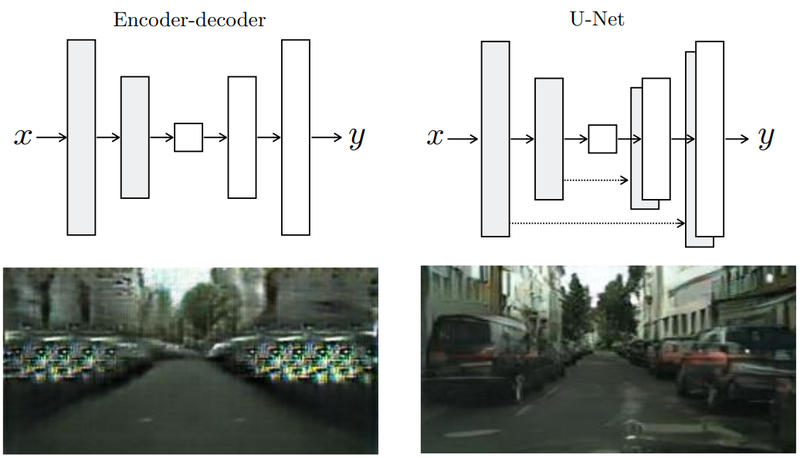

위 그림에서 각 구조 아래에 표시된 이미지는 해당 구조를 Generator로 사용했을 때의 결과이다.

단순한 Encoder-Decoder 구조에 비해 Encoder와 Decoder 사이를 skip connection으로 연결한 U-Net 구조를 사용한 결과가 훨씬 더 실제 이미지에 가까운 품질을 보인다.

이전 단계에서 구현했던 Generator는 위 그림의 Encoder-decoder 구조이다.  
Encoder에서 출력된 결과를 Decoder의 입력으로 연결했고, 이 외에 추가적으로 Encoder와 Decoder를 연결시키는 부분은 없었다. 더 좋은 결과를 기대하기 위해 이전에 구현했던 것들을 조금 수정하여 위 그림의 U-Net 구조를 만들고 실험해 보자.  
(아래 단락부터는 두 가지 구조를 각각 "Encoder-Decoder Generator" 및 "U-Net Generator"라는 용어로 구분하여 사용하겠다)

먼저 Encoder 및 Decoder에 사용되는 기본적인 블록은 이전에 방금 위 코드와 같이 구현했었다.

정의된 블록들을 이용해 한 번에 U-Net Generator를 정의해 보겠다. 아래 모델의 __init__() 메서드에서 Encoder 및 Decoder에서 사용할 모든 블록들을 정의해 놓고, call()에서 forward propagation 하도록 한다. 이전 구현에는 없었던 skip connection이 call() 내부에서 어떻게 구현되었는지 잘 확인해 보자.

In [11]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


먼저, __init__() 에서 정의된 encode_blocks 및 decode_blocks가 call() 내부에서 차례대로 사용되어 Encoder 및 Decoder 내부 연산을 수행한다.  
이때, Encoder와 Decoder 사이의 skip connection을 위해 features 라는 리스트를 만들고 Encoder 내에서 사용된 각 블록들의 출력을 차례대로 담았다.  
이후 Encoder의 최종 출력이 Decoder의 입력으로 들어가면서 다시 한번 각각의 Decoder 블록들을 통과하는데,  
features 리스트에 있는 각각의 출력들이 Decoder 블록 연산 후 함께 연결되어 다음 블록의 입력으로 사용된다.

아래 질문에 답하면서 조금 더 자세히 이해해 보자.

Q: 위 코드의 call() 내에서 features = features[:-1] 는 왜 필요할까?

A: Skip connection을 위해 만들어진 features 리스트에는 Encoder 내 각 블록의 출력이 들어있는데, Encoder의 마지막 출력(feature리스트 의 마지막 항목)은 Decoder로 직접 입력되므로 skip connection의 대상이 아니다.

Q: 위 코드의 call() 내의 Decoder 연산 부분에서 features[::-1] 는 왜 필요할까?

A: Skip connection은 Encoder 내 첫 번째 블록의 출력이 Decoder의 마지막 블록에 연결되고, Encoder 내 두 번째 블록의 출력이 Decoder의 뒤에서 2번째 블록에 연결되는.. 등 대칭을 이룬다(맨 위 U-Net 구조 사진 참고). features에는 Encoder 블록들의 출력들이 순서대로 쌓여있고, 이를 Decoder에서 차례대로 사용하기 위해서 features의 역순으로 연결한다.

Q: 아래와 같은 데이터 A, B가 있을 때,

데이터 A 크기 : (32,128,128,200) #(batch, width, height, channel)  
데이터 B 크기 : (32,128,128,400) #(batch, width, height, channel)  
여기서 사용되는 skip connection은 layers.Concatenate() 결과의 크기는 무엇일까?

A: (128,128,600) layers.Concatenate() 내에 별다른 설정이 없다면 가장 마지막 축(채널 축)을 기준으로 서로 연결된다.

이제야 Generator 구현이 끝났다.

마지막으로 완성된 U-Net 구조 Generator 내부의 각 출력이 적절한지 아래 코드로 확인해 보자.

In [12]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[0][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[0][0]             
______________________________________________________________________________________________

이전 Encoder-Decoder Generator 구조에서 학습해야 할 파라미터보다 Skip connection을 추가한 U-Net Generator의 파라미터는 꽤나 많이 늘어났다.

Q: U-Net Generator의 파라미터가 늘어난 곳은 Encoder와 Decoder 중 어디일까?  
또한, 두 종류의 Generator 구조에서 동일한 수의 convolution 레이어를 사용했는데, 구체적으로 어느 부분에서 파라미터가 늘어났을까?

A: U-Net Generator의 Decoder 구조 내 파라미터가 많아졌다. 이 부분의 각 convolution 레이어에서 사용된 필터의 수는 두 종류의 Decoder에서 동일하지만, 그 크기가 다르다.

예를 들어, 이전 Decoder 블록의 출력의 크기가 (16,16,512)라면,  
Encoder-decoder Generator의 경우, Decoder의 다음 블록에서 계산할 convolution의 필터 크기는 4x4x512이다.

U-Net Generator의 경우, Encoder 내 블록 출력이 함께 연결되어 Decoder의 다음 블록에서 계산할 convolution의 필터 크기는 4x4x(512+512)이다.

정리하면, U-Net Generator에서 사용한 skip-connection으로 인해 Decoder의 각 블록에서 입력받는 채널 수가 늘어났고, 이에 따라 블록 내 convolution 레이어에서 사용하는 필터 크기가 커지면서 학습해야 할 파라미터가 늘어났다.

## Discriminator 구성하기

Generator만으로 좋은 결과를 도출하기에는 부족하다. 조금 더 사실적인 이미지를 생성하기 위한 Pix2Pix를 완성시키기 위해서는 Discriminator가 필요하다.
이번 단계에서 Discriminator를 만들어 Pix2Pix 구조를 완성시켜 보자.

### Discriminator의 구성요소 알아보기
Generator를 만들기 전에 봤듯이 먼저 Pix2Pix 논문에서 Discriminator를 구성하는데 필요한 정보를 아래에 가져왔다.

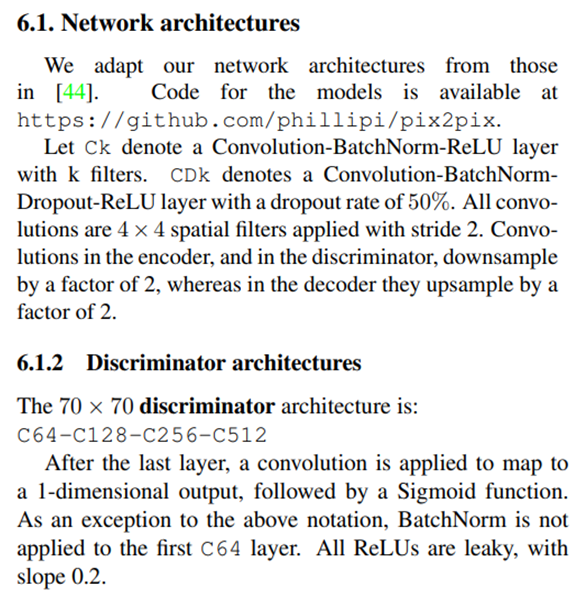

Generator의 구성 요소와 똑같이 "C64" 등으로 표기되어 있다. 진짜 및 가짜 이미지를 판별하기 위해 최종 출력에 sigmoid를 사용하는 것을 제외하면 특별한 변경 사항은 없는 것 같다.

이어서 아래의 보기 쉽게 표현한 그림을 통해 Discriminator의 구조를 머릿속에 조금 더 자세히 그려보자.

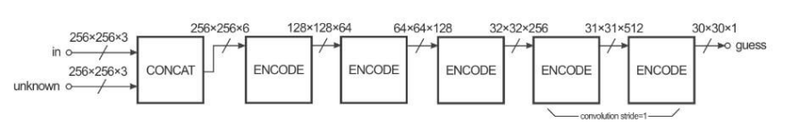

Discriminator는 2개 입력(위 그림의 "in", "unknown")을 받아 연결(CONCAT)한 후, ENCODE 라고 쓰인 5개의 블록을 통과한다. 이 중 마지막 블록을 제외한 4개 블록은 위 논문에서 표기된 "C64-C128-C256-C512"에 해당하며, 마지막은 1(채널)차원 출력을 위한 블록이 추가되었다.

최종적으로 출력되는 크기는 (30,30,1) 이며, 위 그림의 출력 이전의 2개의 ENCODE 블록을 보면 각각의 출력 크기가 32, 31, 30으로 1씩 감소하는 것을 알 수 있다. Generator에서도 사용했던 2 stride convolution에 패딩을 이용하면 (width, height) 크기가 절반씩 감소할 것이다. 1 stride convolution에 패딩을 하지 않는다면 (width, height) 크기는 (필터 크기가 4이므로) 3씩 감소할 텐데, 그림과 같이 1씩 감소하도록 하려면 무언가 다른 방법을 써야 할 것 같다. 이 부분이 지금 이해되지 않는다면 아래 코드에서 다시 다룰 테니 우선 넘어간다.

추가적으로 위 그림에서 최종 출력 크기가 (30,30,1)이 되어야 하는 이유는 앞서 Discriminator에 대해 알아봤던 70x70 PatchGAN을 사용했기 때문이다. 최종 (30,30) 출력에서 각 픽셀의 receptive field 크기를 (70,70)으로 맞추기 위해 Discriminator의 출력 크기를 (30,30) 크기로 강제로 맞추는 과정이다.

Convolution Layer에서 kernel크기, stride, padding 등을 토대로 출력 크기를 계산했던 방식을 그대로 사용하면 계산할 수 있는데 자세한 계산 과정은 아래 링크를 참고한다.

[● Understanding PatchGAN][1]

[1]: https://sahiltinky94.medium.com/understanding-patchgan-9f3c8380c207

이 부분만 제외하면 전반적으로는 Generator보다 간단한 것 같다. 구현해 보자.

### Discriminator 구현하기
마찬가지로 Discriminator에 사용할 기본적인 블록부터 만들겠다.

In [13]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


__init__() 에서 필요한 만큼 많은 설정을 가능하게끔 했다. 필터의 수(n_filters), 필터가 순회하는 간격(stride), 출력 feature map의 크기를 조절할 수 있도록 하는 패딩 설정(custom_pad), BatchNorm의 사용 여부(use_bn), 활성화 함수 사용 여부(act)가 설정 가능하다.

아래 질문에 답하면서 위 코드가 어떻게 동작하는지 생각해 보자.

Q: 위에서 만든 DiscBlock의 설정을 다음과 같이 하여 DiscBlock(n_filters=64, stride=1, custom_pad=True, use_bn=True, act=True) 으로 생성된 블록에 (width, height, channel) = (128, 128, 32) 크기가 입력된다면, 블록 내부에서 순서대로 어떠한 레이어를 통과하는지, 그리고 각 레이어를 통과했을 때 출력 크기는 어떻게 되는지 적어보자.

A:  
1. 패딩 레이어 통과 layers.ZeroPadding2D() → (130,130,32)  
2. Convolution 레이어 통과 layers.Conv2D(64,4,1,"valid") → (127,127,64)  
3. BatchNormalization 레이어 통과 layers.BatchNormalization() → (127,127,64)  
4. LeakyReLU 활성화 레이어 통과 layers.LeakyReLU(0.2) → (127,127,64)

이전 Discriminator를 표현한 그림에서 마지막 2개 블록의 출력은 입력에 비해 (width, height) 크기가 1씩 감소한다는 것을 언급했었다. 1씩 감소시키기 위한 방법이 위 질문의 답이며, 이에 대해 자세히 설명해 보겠다.

1. (128,128,32) 크기의 입력이 layers.ZeroPadding2D()를 통과하면, width 및 height의 양쪽 면에 각각 1씩 패딩되어 총 2만큼 크기가 늘어난다. 출력 : (130,130,32)  
2. 패딩하지 않고 필터 크기 4 및 간격(stride) 1의 convolution 레이어를 통과하면 width 및 height 가 3씩 줄어든다. 이는 OutSize=(InSize+2∗PadSize−FilterSize)/Stride+1 의 식으로 계산할 수 있다. 채널 수는 사용한 필터 개수와 같다. 출력 : (127,127,64)  
3. 이 외 다른 레이어(BatchNorm, LeakyReLU)는 출력의 크기에 영향을 주지 않는다.  

간단하게 코드를 작성하여 각 출력의 크기가 맞는지 확인해 보자.

In [14]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 32)]    0         
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 130, 130, 32)      0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 127, 127, 64)      32768     
_________________________________________________________________
batch_normalization_15 (Batc (None, 127, 127, 64)      256       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 127, 127, 64)      0         
Total params: 33,024
Trainable params: 32,896
Non-trainable params: 128
_________________________________________________________________


이러한 코드와 비슷한 설정으로 (width, height) 크기를 1씩 감소시킬 수 있다. 마지막 2개 블록은 출력의 크기가 1씩 감소하므로 이런 방식을 적용하면 되겠다.

Pix2Pix의 Discriminator가 70x70 PatchGAN을 사용하기 때문에 최종 출력을 (30,30) 크기로 맞추느라 위와 같이 조금 복잡한 과정을 설명했다.  
사용할 기본적인 블록을 만들었으니 이를 이용해 바로 Discriminator를 만들어보자.

In [15]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


__init__() 내부에서 사용할 블록들을 정의했는데, 이전의 구현들처럼 (위 코드의 주석 처리된 부분과 같이) for loop로 간편하게 블록을 만들 수도 있지만, 쉽게 코드를 읽게끔 총 6개 블록을 각각 따로 만들었다.  
첫 번째 블록은 단순한 연결(concat)을 수행하며, Discriminator의 최종 출력은 sigmoid 활성화를 사용했다.

각 블록의 출력 크기가 알맞게 되었는지 아래 코드로 확인해 보자.

In [16]:
Discriminator().get_summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_3[0][0]                    
                                                                 input_4[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

두 개의 (256,256,3) 크기 입력으로 최종 (30,30,1) 출력을 만들었고, 아래의 Discriminator를 나타낸 그림과 각 출력 크기가 일치한다.

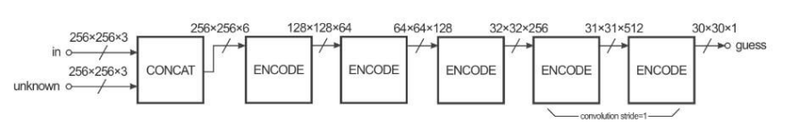

시험 삼아 임의의 (256,256,3) 크기의 입력을 넣어 나오는 (30,30) 출력을 시각화해보겠다.

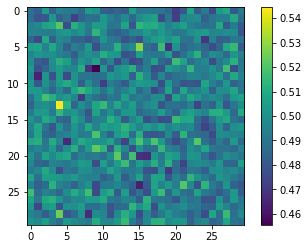

In [17]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

이전 PatchGAN에 대해 설명했던 것처럼, 위 (30,30) 크기를 갖는 결과 이미지의 각 픽셀 값은 원래 입력의 (70,70) 패치에 대한 분류 결과이다. 전체 입력의 크기가 (256,256) 이므로, 각각의 (70,70) 패치는 원래 입력상에서 많이 겹쳐있을 것이다. 각각의 픽셀 값은 sigmoid 함수의 결괏값이므로 0~1 사이의 값을 가지며, 진짜 및 가짜 데이터를 판별해 내는 데 사용한다.

드디어 Pix2Pix를 구성하는 Generator와 Discriminator의 구현이 끝났다.  
다음 단계에서 본격적인 모델 학습을 진행해 보자!

## 학습 및 테스트하기

이번 단계에서는 구현된 Generator와 Discriminator를 학습시켜보고, 스케치를 입력으로 채색된 이미지를 생성해 보자. 먼저 학습에 필요한 손실 함수부터 정의하겠다.
논문의 여러 실험 결과 중 손실 함수 선택에 따른 결과의 차이는 아래와 같다.

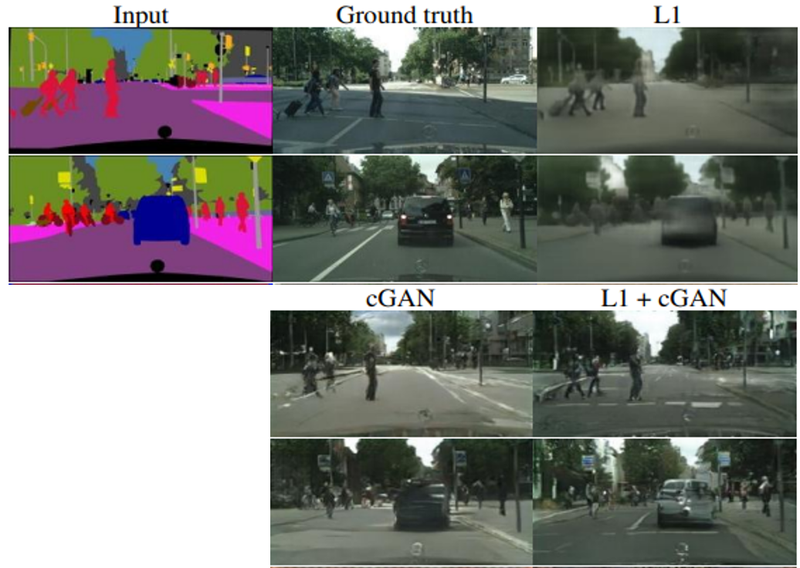

레이블 정보만 있는 입력에 대해 여러 손실 함수를 사용해 실제 이미지를 만들어 낸 결과는, 일반적인 GAN의 손실 함수에 L1을 추가로 이용했을 때 가장 실제에 가까운 이미지를 생성해 냈다. 이번 실험에서도 두 가지 손실 함수를 모두 사용해보자.

In [18]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


Generator 및 Discriminator의 손실 계산을 각각 정의했다.

Generator의 손실 함수 (위 코드의 get_gene_loss)는 총 3개의 입력이 있다. 이 중 fake_disc는 Generator가 생성한 가짜 이미지를 Discriminator에 입력하여 얻어진 값이며, 실제 이미지를 뜻하는 "1"과 비교하기 위해 tf.ones_like()를 사용한다. 또한 L1 손실을 계산하기 위해 생성한 가짜 이미지(fake_output)와 실제 이미지(real_output) 사이의 MAE(Mean Absolute Error)를 계산한다.

Discriminator의 손실 함수 (위 코드의 get_disc_loss)는 2개의 입력이 있으며, 이들은 가짜 및 진짜 이미지가 Discriminator에 각각 입력되어 얻어진 값이다. Discriminator는 실제 이미지를 잘 구분해 내야 하므로 real_disc는 "1"로 채워진 벡터와 비교하고, fake_disc는 "0"으로 채워진 벡터와 비교한다.

사용할 optimizer는 논문과 동일하게 아래와 같이 설정한다.

In [19]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


하나의 배치 크기만큼 데이터를 입력했을 때 가중치를 1회 업데이트하는 과정은 아래와 같이 구현했다.

In [20]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


전반적인 학습 과정은 앞서 진행했었던 cGAN 학습과 크게 다르지 않다.
다만 위 코드의 gene_total_loss 계산 라인에서 최종 Generator 손실을 계산할 때, L1 손실에 100을 곱한 부분을 확인해야한다(## 이 표시가 있는 부분을 확인해 보자). 논문에서는 Generator의 손실을 아래와 같이 정의했다.

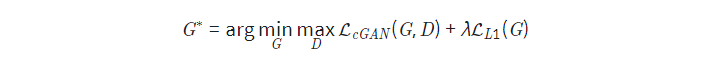

위 식에서 λ는 학습 과정에서 L1 손실을 얼마나 반영할 것인지를 나타내며 논문에서는 λ=100을 사용했다.

앞서 정의한 함수를 이용해서 학습을 진행한다. 우리는 200 epoch 학습해 볼 것이다. 이는 시간이 상당히 오래 걸린다.

In [21]:
EPOCHS = 200

generator = UNetGenerator()
discriminator = Discriminator()

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
                
        # 10회 반복마다 손실을 출력합니다.
        if (i+1) % 10 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[10]                     
Generator_loss:0.9598                     
L1_loss:0.3012                     
Discriminator_loss:1.2882

EPOCH[1] - STEP[20]                     
Generator_loss:1.0663                     
L1_loss:0.2242                     
Discriminator_loss:1.3606

EPOCH[1] - STEP[30]                     
Generator_loss:1.0556                     
L1_loss:0.1849                     
Discriminator_loss:1.4276

EPOCH[1] - STEP[40]                     
Generator_loss:0.8599                     
L1_loss:0.1943                     
Discriminator_loss:1.3195

EPOCH[1] - STEP[50]                     
Generator_loss:1.1754                     
L1_loss:0.1847                     
Discriminator_loss:1.1856

EPOCH[1] - STEP[60]                     
Generator_loss:0.9044                     
L1_loss:0.1880                     
Discriminator_loss:1.1439

EPOCH[1] - STEP[70]                     
Generator_loss:1.0821                     
L1_loss:0.2049                    

EPOCH[3] - STEP[70]                     
Generator_loss:1.2882                     
L1_loss:0.1733                     
Discriminator_loss:1.1298

EPOCH[3] - STEP[80]                     
Generator_loss:1.8075                     
L1_loss:0.1672                     
Discriminator_loss:0.8437

EPOCH[3] - STEP[90]                     
Generator_loss:1.3272                     
L1_loss:0.1941                     
Discriminator_loss:1.2141

EPOCH[3] - STEP[100]                     
Generator_loss:0.7612                     
L1_loss:0.1834                     
Discriminator_loss:1.1711

EPOCH[3] - STEP[110]                     
Generator_loss:2.2403                     
L1_loss:0.1826                     
Discriminator_loss:0.5360

EPOCH[3] - STEP[120]                     
Generator_loss:1.1056                     
L1_loss:0.1928                     
Discriminator_loss:0.7127

EPOCH[3] - STEP[130]                     
Generator_loss:3.5494                     
L1_loss:0.1889                

EPOCH[5] - STEP[130]                     
Generator_loss:1.9386                     
L1_loss:0.1775                     
Discriminator_loss:0.9352

EPOCH[5] - STEP[140]                     
Generator_loss:1.8920                     
L1_loss:0.1899                     
Discriminator_loss:0.5952

EPOCH[5] - STEP[150]                     
Generator_loss:0.7203                     
L1_loss:0.1824                     
Discriminator_loss:1.0197

EPOCH[5] - STEP[160]                     
Generator_loss:1.5378                     
L1_loss:0.1716                     
Discriminator_loss:1.1698

EPOCH[5] - STEP[170]                     
Generator_loss:0.4382                     
L1_loss:0.2166                     
Discriminator_loss:1.5230

EPOCH[5] - STEP[180]                     
Generator_loss:1.0510                     
L1_loss:0.1862                     
Discriminator_loss:0.9157

EPOCH[5] - STEP[190]                     
Generator_loss:2.2884                     
L1_loss:0.1465             

EPOCH[7] - STEP[190]                     
Generator_loss:1.1293                     
L1_loss:0.2246                     
Discriminator_loss:0.5191

EPOCH[7] - STEP[200]                     
Generator_loss:1.3391                     
L1_loss:0.1546                     
Discriminator_loss:1.2966

EPOCH[7] - STEP[210]                     
Generator_loss:1.7107                     
L1_loss:0.2148                     
Discriminator_loss:0.3431

EPOCH[7] - STEP[220]                     
Generator_loss:2.2524                     
L1_loss:0.1716                     
Discriminator_loss:0.2045

EPOCH[7] - STEP[230]                     
Generator_loss:1.2034                     
L1_loss:0.1783                     
Discriminator_loss:0.5625

EPOCH[7] - STEP[240]                     
Generator_loss:2.1404                     
L1_loss:0.1769                     
Discriminator_loss:0.8284

EPOCH[7] - STEP[250]                     
Generator_loss:0.8050                     
L1_loss:0.1731             

EPOCH[9] - STEP[250]                     
Generator_loss:1.5226                     
L1_loss:0.1806                     
Discriminator_loss:0.5413

EPOCH[10] - STEP[10]                     
Generator_loss:1.6177                     
L1_loss:0.1646                     
Discriminator_loss:0.8901

EPOCH[10] - STEP[20]                     
Generator_loss:1.5190                     
L1_loss:0.1686                     
Discriminator_loss:1.0527

EPOCH[10] - STEP[30]                     
Generator_loss:3.1134                     
L1_loss:0.2016                     
Discriminator_loss:0.5203

EPOCH[10] - STEP[40]                     
Generator_loss:0.5334                     
L1_loss:0.1839                     
Discriminator_loss:1.3469

EPOCH[10] - STEP[50]                     
Generator_loss:1.7541                     
L1_loss:0.1902                     
Discriminator_loss:0.6648

EPOCH[10] - STEP[60]                     
Generator_loss:3.4548                     
L1_loss:0.1534             

EPOCH[12] - STEP[60]                     
Generator_loss:1.3538                     
L1_loss:0.1478                     
Discriminator_loss:1.1879

EPOCH[12] - STEP[70]                     
Generator_loss:1.2185                     
L1_loss:0.1559                     
Discriminator_loss:1.0989

EPOCH[12] - STEP[80]                     
Generator_loss:2.8856                     
L1_loss:0.1799                     
Discriminator_loss:2.4143

EPOCH[12] - STEP[90]                     
Generator_loss:1.2215                     
L1_loss:0.1518                     
Discriminator_loss:0.7648

EPOCH[12] - STEP[100]                     
Generator_loss:1.7151                     
L1_loss:0.1797                     
Discriminator_loss:2.1121

EPOCH[12] - STEP[110]                     
Generator_loss:0.9204                     
L1_loss:0.1359                     
Discriminator_loss:0.7569

EPOCH[12] - STEP[120]                     
Generator_loss:1.1712                     
L1_loss:0.1532          

EPOCH[14] - STEP[120]                     
Generator_loss:0.9852                     
L1_loss:0.1714                     
Discriminator_loss:0.9290

EPOCH[14] - STEP[130]                     
Generator_loss:2.5809                     
L1_loss:0.1577                     
Discriminator_loss:1.0538

EPOCH[14] - STEP[140]                     
Generator_loss:2.0365                     
L1_loss:0.2179                     
Discriminator_loss:0.1891

EPOCH[14] - STEP[150]                     
Generator_loss:1.1351                     
L1_loss:0.1722                     
Discriminator_loss:0.5799

EPOCH[14] - STEP[160]                     
Generator_loss:2.3861                     
L1_loss:0.1840                     
Discriminator_loss:1.8122

EPOCH[14] - STEP[170]                     
Generator_loss:1.5615                     
L1_loss:0.1627                     
Discriminator_loss:0.5797

EPOCH[14] - STEP[180]                     
Generator_loss:1.1821                     
L1_loss:0.1886      

EPOCH[16] - STEP[180]                     
Generator_loss:1.8379                     
L1_loss:0.1912                     
Discriminator_loss:0.8881

EPOCH[16] - STEP[190]                     
Generator_loss:0.2025                     
L1_loss:0.2289                     
Discriminator_loss:2.1134

EPOCH[16] - STEP[200]                     
Generator_loss:1.4045                     
L1_loss:0.1639                     
Discriminator_loss:0.6699

EPOCH[16] - STEP[210]                     
Generator_loss:1.0671                     
L1_loss:0.1844                     
Discriminator_loss:1.4106

EPOCH[16] - STEP[220]                     
Generator_loss:2.8858                     
L1_loss:0.1373                     
Discriminator_loss:1.7586

EPOCH[16] - STEP[230]                     
Generator_loss:1.8891                     
L1_loss:0.1802                     
Discriminator_loss:0.2602

EPOCH[16] - STEP[240]                     
Generator_loss:1.8646                     
L1_loss:0.2062      

EPOCH[18] - STEP[240]                     
Generator_loss:0.3503                     
L1_loss:0.1702                     
Discriminator_loss:1.5378

EPOCH[18] - STEP[250]                     
Generator_loss:1.5388                     
L1_loss:0.1794                     
Discriminator_loss:0.3175

EPOCH[19] - STEP[10]                     
Generator_loss:1.7861                     
L1_loss:0.1675                     
Discriminator_loss:0.8756

EPOCH[19] - STEP[20]                     
Generator_loss:2.8543                     
L1_loss:0.1755                     
Discriminator_loss:0.4586

EPOCH[19] - STEP[30]                     
Generator_loss:0.8080                     
L1_loss:0.1979                     
Discriminator_loss:0.7851

EPOCH[19] - STEP[40]                     
Generator_loss:2.6580                     
L1_loss:0.1991                     
Discriminator_loss:1.6470

EPOCH[19] - STEP[50]                     
Generator_loss:2.0200                     
L1_loss:0.1653           

EPOCH[21] - STEP[50]                     
Generator_loss:1.2054                     
L1_loss:0.1896                     
Discriminator_loss:0.5334

EPOCH[21] - STEP[60]                     
Generator_loss:1.5771                     
L1_loss:0.1681                     
Discriminator_loss:1.6307

EPOCH[21] - STEP[70]                     
Generator_loss:0.2226                     
L1_loss:0.2091                     
Discriminator_loss:2.3532

EPOCH[21] - STEP[80]                     
Generator_loss:0.5433                     
L1_loss:0.1768                     
Discriminator_loss:1.2128

EPOCH[21] - STEP[90]                     
Generator_loss:2.3072                     
L1_loss:0.1605                     
Discriminator_loss:1.6061

EPOCH[21] - STEP[100]                     
Generator_loss:2.2081                     
L1_loss:0.1622                     
Discriminator_loss:0.8594

EPOCH[21] - STEP[110]                     
Generator_loss:1.6500                     
L1_loss:0.2085           

EPOCH[23] - STEP[110]                     
Generator_loss:1.4138                     
L1_loss:0.1636                     
Discriminator_loss:0.4443

EPOCH[23] - STEP[120]                     
Generator_loss:0.6875                     
L1_loss:0.1684                     
Discriminator_loss:1.0731

EPOCH[23] - STEP[130]                     
Generator_loss:1.8180                     
L1_loss:0.1576                     
Discriminator_loss:0.8878

EPOCH[23] - STEP[140]                     
Generator_loss:1.9288                     
L1_loss:0.1796                     
Discriminator_loss:1.0979

EPOCH[23] - STEP[150]                     
Generator_loss:0.9286                     
L1_loss:0.1684                     
Discriminator_loss:0.8925

EPOCH[23] - STEP[160]                     
Generator_loss:0.9738                     
L1_loss:0.2127                     
Discriminator_loss:0.9854

EPOCH[23] - STEP[170]                     
Generator_loss:1.0638                     
L1_loss:0.1974      

EPOCH[25] - STEP[170]                     
Generator_loss:0.9136                     
L1_loss:0.1760                     
Discriminator_loss:0.6768

EPOCH[25] - STEP[180]                     
Generator_loss:1.0372                     
L1_loss:0.1888                     
Discriminator_loss:0.8329

EPOCH[25] - STEP[190]                     
Generator_loss:0.6175                     
L1_loss:0.1848                     
Discriminator_loss:1.0651

EPOCH[25] - STEP[200]                     
Generator_loss:1.3904                     
L1_loss:0.1914                     
Discriminator_loss:0.4712

EPOCH[25] - STEP[210]                     
Generator_loss:1.6291                     
L1_loss:0.1705                     
Discriminator_loss:0.3211

EPOCH[25] - STEP[220]                     
Generator_loss:1.5381                     
L1_loss:0.2078                     
Discriminator_loss:0.3305

EPOCH[25] - STEP[230]                     
Generator_loss:0.6433                     
L1_loss:0.1770      

EPOCH[27] - STEP[230]                     
Generator_loss:1.8871                     
L1_loss:0.1846                     
Discriminator_loss:0.3534

EPOCH[27] - STEP[240]                     
Generator_loss:0.7317                     
L1_loss:0.1682                     
Discriminator_loss:1.1150

EPOCH[27] - STEP[250]                     
Generator_loss:2.1339                     
L1_loss:0.1729                     
Discriminator_loss:1.0720

EPOCH[28] - STEP[10]                     
Generator_loss:1.2778                     
L1_loss:0.1837                     
Discriminator_loss:0.6831

EPOCH[28] - STEP[20]                     
Generator_loss:0.9740                     
L1_loss:0.1600                     
Discriminator_loss:0.6537

EPOCH[28] - STEP[30]                     
Generator_loss:1.3169                     
L1_loss:0.1745                     
Discriminator_loss:0.5619

EPOCH[28] - STEP[40]                     
Generator_loss:1.1575                     
L1_loss:0.1789          

EPOCH[30] - STEP[40]                     
Generator_loss:1.5381                     
L1_loss:0.1599                     
Discriminator_loss:0.9123

EPOCH[30] - STEP[50]                     
Generator_loss:2.7347                     
L1_loss:0.1663                     
Discriminator_loss:2.5810

EPOCH[30] - STEP[60]                     
Generator_loss:0.4480                     
L1_loss:0.1620                     
Discriminator_loss:1.6237

EPOCH[30] - STEP[70]                     
Generator_loss:2.0182                     
L1_loss:0.1304                     
Discriminator_loss:1.4224

EPOCH[30] - STEP[80]                     
Generator_loss:1.1664                     
L1_loss:0.1890                     
Discriminator_loss:0.5683

EPOCH[30] - STEP[90]                     
Generator_loss:0.9302                     
L1_loss:0.1919                     
Discriminator_loss:1.3367

EPOCH[30] - STEP[100]                     
Generator_loss:1.5624                     
L1_loss:0.2194            

EPOCH[32] - STEP[100]                     
Generator_loss:1.0345                     
L1_loss:0.1687                     
Discriminator_loss:0.6451

EPOCH[32] - STEP[110]                     
Generator_loss:0.7265                     
L1_loss:0.1789                     
Discriminator_loss:1.0189

EPOCH[32] - STEP[120]                     
Generator_loss:0.2601                     
L1_loss:0.1732                     
Discriminator_loss:3.1134

EPOCH[32] - STEP[130]                     
Generator_loss:1.1923                     
L1_loss:0.1458                     
Discriminator_loss:0.7963

EPOCH[32] - STEP[140]                     
Generator_loss:1.0666                     
L1_loss:0.1661                     
Discriminator_loss:0.7185

EPOCH[32] - STEP[150]                     
Generator_loss:0.6552                     
L1_loss:0.1849                     
Discriminator_loss:1.2678

EPOCH[32] - STEP[160]                     
Generator_loss:1.6916                     
L1_loss:0.1663      

EPOCH[34] - STEP[160]                     
Generator_loss:1.5891                     
L1_loss:0.2095                     
Discriminator_loss:0.3172

EPOCH[34] - STEP[170]                     
Generator_loss:1.0309                     
L1_loss:0.1491                     
Discriminator_loss:1.2403

EPOCH[34] - STEP[180]                     
Generator_loss:1.4185                     
L1_loss:0.1796                     
Discriminator_loss:0.9356

EPOCH[34] - STEP[190]                     
Generator_loss:0.3567                     
L1_loss:0.1674                     
Discriminator_loss:1.5411

EPOCH[34] - STEP[200]                     
Generator_loss:2.9955                     
L1_loss:0.1657                     
Discriminator_loss:0.8950

EPOCH[34] - STEP[210]                     
Generator_loss:1.1807                     
L1_loss:0.2022                     
Discriminator_loss:0.4587

EPOCH[34] - STEP[220]                     
Generator_loss:1.0362                     
L1_loss:0.1947      

EPOCH[36] - STEP[220]                     
Generator_loss:1.8151                     
L1_loss:0.1716                     
Discriminator_loss:0.8468

EPOCH[36] - STEP[230]                     
Generator_loss:2.3301                     
L1_loss:0.1571                     
Discriminator_loss:1.7341

EPOCH[36] - STEP[240]                     
Generator_loss:1.4968                     
L1_loss:0.1276                     
Discriminator_loss:2.0670

EPOCH[36] - STEP[250]                     
Generator_loss:1.7701                     
L1_loss:0.2220                     
Discriminator_loss:0.2272

EPOCH[37] - STEP[10]                     
Generator_loss:0.5038                     
L1_loss:0.2433                     
Discriminator_loss:1.0729

EPOCH[37] - STEP[20]                     
Generator_loss:0.7377                     
L1_loss:0.1389                     
Discriminator_loss:2.3424

EPOCH[37] - STEP[30]                     
Generator_loss:0.7770                     
L1_loss:0.1729         

EPOCH[39] - STEP[30]                     
Generator_loss:0.9593                     
L1_loss:0.1826                     
Discriminator_loss:1.0754

EPOCH[39] - STEP[40]                     
Generator_loss:1.9658                     
L1_loss:0.1558                     
Discriminator_loss:0.4038

EPOCH[39] - STEP[50]                     
Generator_loss:1.5742                     
L1_loss:0.1504                     
Discriminator_loss:1.4824

EPOCH[39] - STEP[60]                     
Generator_loss:2.2111                     
L1_loss:0.1681                     
Discriminator_loss:1.9925

EPOCH[39] - STEP[70]                     
Generator_loss:1.7527                     
L1_loss:0.1721                     
Discriminator_loss:0.8444

EPOCH[39] - STEP[80]                     
Generator_loss:1.2798                     
L1_loss:0.1718                     
Discriminator_loss:0.4583

EPOCH[39] - STEP[90]                     
Generator_loss:1.0237                     
L1_loss:0.1690             

EPOCH[41] - STEP[90]                     
Generator_loss:1.7707                     
L1_loss:0.1982                     
Discriminator_loss:0.4496

EPOCH[41] - STEP[100]                     
Generator_loss:1.1443                     
L1_loss:0.1939                     
Discriminator_loss:1.4877

EPOCH[41] - STEP[110]                     
Generator_loss:0.4809                     
L1_loss:0.1821                     
Discriminator_loss:1.1588

EPOCH[41] - STEP[120]                     
Generator_loss:0.9927                     
L1_loss:0.1685                     
Discriminator_loss:3.3540

EPOCH[41] - STEP[130]                     
Generator_loss:1.7858                     
L1_loss:0.1631                     
Discriminator_loss:1.2972

EPOCH[41] - STEP[140]                     
Generator_loss:0.6529                     
L1_loss:0.2193                     
Discriminator_loss:0.8346

EPOCH[41] - STEP[150]                     
Generator_loss:0.7112                     
L1_loss:0.1987       

EPOCH[43] - STEP[150]                     
Generator_loss:2.0089                     
L1_loss:0.2108                     
Discriminator_loss:0.1852

EPOCH[43] - STEP[160]                     
Generator_loss:0.5799                     
L1_loss:0.1627                     
Discriminator_loss:1.1792

EPOCH[43] - STEP[170]                     
Generator_loss:2.3926                     
L1_loss:0.1838                     
Discriminator_loss:0.1396

EPOCH[43] - STEP[180]                     
Generator_loss:2.5481                     
L1_loss:0.1706                     
Discriminator_loss:1.4142

EPOCH[43] - STEP[190]                     
Generator_loss:0.8518                     
L1_loss:0.2041                     
Discriminator_loss:0.6920

EPOCH[43] - STEP[200]                     
Generator_loss:1.4499                     
L1_loss:0.1751                     
Discriminator_loss:1.5063

EPOCH[43] - STEP[210]                     
Generator_loss:2.5396                     
L1_loss:0.2087      

EPOCH[45] - STEP[210]                     
Generator_loss:2.9661                     
L1_loss:0.1566                     
Discriminator_loss:1.1350

EPOCH[45] - STEP[220]                     
Generator_loss:1.2556                     
L1_loss:0.2044                     
Discriminator_loss:0.3856

EPOCH[45] - STEP[230]                     
Generator_loss:1.5344                     
L1_loss:0.1267                     
Discriminator_loss:1.8249

EPOCH[45] - STEP[240]                     
Generator_loss:1.0421                     
L1_loss:0.1988                     
Discriminator_loss:0.6326

EPOCH[45] - STEP[250]                     
Generator_loss:1.7931                     
L1_loss:0.1717                     
Discriminator_loss:0.5759

EPOCH[46] - STEP[10]                     
Generator_loss:2.3097                     
L1_loss:0.1839                     
Discriminator_loss:2.0271

EPOCH[46] - STEP[20]                     
Generator_loss:1.0639                     
L1_loss:0.1773        

EPOCH[48] - STEP[20]                     
Generator_loss:1.8464                     
L1_loss:0.1589                     
Discriminator_loss:0.3446

EPOCH[48] - STEP[30]                     
Generator_loss:0.8517                     
L1_loss:0.1712                     
Discriminator_loss:0.6648

EPOCH[48] - STEP[40]                     
Generator_loss:1.5743                     
L1_loss:0.1673                     
Discriminator_loss:0.6181

EPOCH[48] - STEP[50]                     
Generator_loss:1.2485                     
L1_loss:0.1728                     
Discriminator_loss:0.7813

EPOCH[48] - STEP[60]                     
Generator_loss:1.1276                     
L1_loss:0.1755                     
Discriminator_loss:0.5579

EPOCH[48] - STEP[70]                     
Generator_loss:1.6158                     
L1_loss:0.1832                     
Discriminator_loss:0.4204

EPOCH[48] - STEP[80]                     
Generator_loss:0.8596                     
L1_loss:0.1685             

EPOCH[50] - STEP[80]                     
Generator_loss:1.7454                     
L1_loss:0.1905                     
Discriminator_loss:0.2633

EPOCH[50] - STEP[90]                     
Generator_loss:0.3707                     
L1_loss:0.1745                     
Discriminator_loss:1.5291

EPOCH[50] - STEP[100]                     
Generator_loss:1.0177                     
L1_loss:0.1803                     
Discriminator_loss:0.6143

EPOCH[50] - STEP[110]                     
Generator_loss:1.1926                     
L1_loss:0.2106                     
Discriminator_loss:0.5689

EPOCH[50] - STEP[120]                     
Generator_loss:1.8410                     
L1_loss:0.2039                     
Discriminator_loss:0.4868

EPOCH[50] - STEP[130]                     
Generator_loss:2.2615                     
L1_loss:0.1561                     
Discriminator_loss:2.3230

EPOCH[50] - STEP[140]                     
Generator_loss:0.7405                     
L1_loss:0.1640        

EPOCH[52] - STEP[140]                     
Generator_loss:1.1284                     
L1_loss:0.1836                     
Discriminator_loss:1.3140

EPOCH[52] - STEP[150]                     
Generator_loss:1.6147                     
L1_loss:0.1970                     
Discriminator_loss:0.4834

EPOCH[52] - STEP[160]                     
Generator_loss:1.2789                     
L1_loss:0.1841                     
Discriminator_loss:0.4987

EPOCH[52] - STEP[170]                     
Generator_loss:2.4420                     
L1_loss:0.1990                     
Discriminator_loss:0.2160

EPOCH[52] - STEP[180]                     
Generator_loss:1.2306                     
L1_loss:0.1772                     
Discriminator_loss:0.6060

EPOCH[52] - STEP[190]                     
Generator_loss:1.4195                     
L1_loss:0.1647                     
Discriminator_loss:1.0641

EPOCH[52] - STEP[200]                     
Generator_loss:1.7561                     
L1_loss:0.1649      

EPOCH[54] - STEP[200]                     
Generator_loss:1.0787                     
L1_loss:0.1744                     
Discriminator_loss:1.1169

EPOCH[54] - STEP[210]                     
Generator_loss:1.5658                     
L1_loss:0.1978                     
Discriminator_loss:0.3544

EPOCH[54] - STEP[220]                     
Generator_loss:0.6985                     
L1_loss:0.2357                     
Discriminator_loss:0.7763

EPOCH[54] - STEP[230]                     
Generator_loss:2.5367                     
L1_loss:0.1642                     
Discriminator_loss:0.8586

EPOCH[54] - STEP[240]                     
Generator_loss:0.8872                     
L1_loss:0.1807                     
Discriminator_loss:0.9445

EPOCH[54] - STEP[250]                     
Generator_loss:1.4429                     
L1_loss:0.1394                     
Discriminator_loss:1.7733

EPOCH[55] - STEP[10]                     
Generator_loss:1.1470                     
L1_loss:0.1806       

EPOCH[57] - STEP[10]                     
Generator_loss:1.9431                     
L1_loss:0.1692                     
Discriminator_loss:0.8887

EPOCH[57] - STEP[20]                     
Generator_loss:0.7563                     
L1_loss:0.1676                     
Discriminator_loss:0.7688

EPOCH[57] - STEP[30]                     
Generator_loss:2.1493                     
L1_loss:0.1915                     
Discriminator_loss:0.6162

EPOCH[57] - STEP[40]                     
Generator_loss:0.1913                     
L1_loss:0.1938                     
Discriminator_loss:2.0832

EPOCH[57] - STEP[50]                     
Generator_loss:2.2354                     
L1_loss:0.1727                     
Discriminator_loss:0.8780

EPOCH[57] - STEP[60]                     
Generator_loss:1.0972                     
L1_loss:0.1588                     
Discriminator_loss:0.5622

EPOCH[57] - STEP[70]                     
Generator_loss:2.3949                     
L1_loss:0.2053             

EPOCH[59] - STEP[70]                     
Generator_loss:1.2179                     
L1_loss:0.1665                     
Discriminator_loss:0.5763

EPOCH[59] - STEP[80]                     
Generator_loss:1.4460                     
L1_loss:0.1987                     
Discriminator_loss:0.4851

EPOCH[59] - STEP[90]                     
Generator_loss:0.5540                     
L1_loss:0.1998                     
Discriminator_loss:1.4243

EPOCH[59] - STEP[100]                     
Generator_loss:2.0183                     
L1_loss:0.1736                     
Discriminator_loss:0.5317

EPOCH[59] - STEP[110]                     
Generator_loss:0.8423                     
L1_loss:0.1849                     
Discriminator_loss:0.8596

EPOCH[59] - STEP[120]                     
Generator_loss:2.0328                     
L1_loss:0.1991                     
Discriminator_loss:0.2846

EPOCH[59] - STEP[130]                     
Generator_loss:1.4604                     
L1_loss:0.1596         

EPOCH[61] - STEP[130]                     
Generator_loss:1.3605                     
L1_loss:0.2405                     
Discriminator_loss:0.3675

EPOCH[61] - STEP[140]                     
Generator_loss:2.0749                     
L1_loss:0.1643                     
Discriminator_loss:1.8480

EPOCH[61] - STEP[150]                     
Generator_loss:0.5586                     
L1_loss:0.1690                     
Discriminator_loss:1.9366

EPOCH[61] - STEP[160]                     
Generator_loss:1.4108                     
L1_loss:0.1720                     
Discriminator_loss:0.5930

EPOCH[61] - STEP[170]                     
Generator_loss:0.5641                     
L1_loss:0.1561                     
Discriminator_loss:1.2011

EPOCH[61] - STEP[180]                     
Generator_loss:1.3413                     
L1_loss:0.1770                     
Discriminator_loss:1.1508

EPOCH[61] - STEP[190]                     
Generator_loss:1.8436                     
L1_loss:0.1611      

EPOCH[63] - STEP[190]                     
Generator_loss:1.7838                     
L1_loss:0.1497                     
Discriminator_loss:0.7063

EPOCH[63] - STEP[200]                     
Generator_loss:1.9211                     
L1_loss:0.1468                     
Discriminator_loss:1.7184

EPOCH[63] - STEP[210]                     
Generator_loss:2.2156                     
L1_loss:0.1537                     
Discriminator_loss:0.9381

EPOCH[63] - STEP[220]                     
Generator_loss:0.5038                     
L1_loss:0.1740                     
Discriminator_loss:1.1250

EPOCH[63] - STEP[230]                     
Generator_loss:1.5617                     
L1_loss:0.1558                     
Discriminator_loss:1.7389

EPOCH[63] - STEP[240]                     
Generator_loss:1.4871                     
L1_loss:0.1565                     
Discriminator_loss:0.8002

EPOCH[63] - STEP[250]                     
Generator_loss:2.4172                     
L1_loss:0.1697      

EPOCH[65] - STEP[250]                     
Generator_loss:2.0274                     
L1_loss:0.1796                     
Discriminator_loss:0.2006

EPOCH[66] - STEP[10]                     
Generator_loss:2.5983                     
L1_loss:0.1600                     
Discriminator_loss:1.5154

EPOCH[66] - STEP[20]                     
Generator_loss:2.3278                     
L1_loss:0.1633                     
Discriminator_loss:0.7624

EPOCH[66] - STEP[30]                     
Generator_loss:0.7821                     
L1_loss:0.1730                     
Discriminator_loss:0.7838

EPOCH[66] - STEP[40]                     
Generator_loss:1.4343                     
L1_loss:0.2145                     
Discriminator_loss:1.4307

EPOCH[66] - STEP[50]                     
Generator_loss:1.9027                     
L1_loss:0.1791                     
Discriminator_loss:0.5239

EPOCH[66] - STEP[60]                     
Generator_loss:0.2208                     
L1_loss:0.1980            

EPOCH[68] - STEP[60]                     
Generator_loss:1.8180                     
L1_loss:0.1476                     
Discriminator_loss:1.0770

EPOCH[68] - STEP[70]                     
Generator_loss:1.9008                     
L1_loss:0.1752                     
Discriminator_loss:1.2823

EPOCH[68] - STEP[80]                     
Generator_loss:2.3704                     
L1_loss:0.1888                     
Discriminator_loss:0.5469

EPOCH[68] - STEP[90]                     
Generator_loss:1.7910                     
L1_loss:0.1607                     
Discriminator_loss:0.5060

EPOCH[68] - STEP[100]                     
Generator_loss:1.1417                     
L1_loss:0.1652                     
Discriminator_loss:2.4786

EPOCH[68] - STEP[110]                     
Generator_loss:1.1614                     
L1_loss:0.1950                     
Discriminator_loss:1.2685

EPOCH[68] - STEP[120]                     
Generator_loss:1.6014                     
L1_loss:0.1720          

EPOCH[70] - STEP[120]                     
Generator_loss:0.8342                     
L1_loss:0.1657                     
Discriminator_loss:0.8373

EPOCH[70] - STEP[130]                     
Generator_loss:0.8294                     
L1_loss:0.1503                     
Discriminator_loss:0.9033

EPOCH[70] - STEP[140]                     
Generator_loss:1.8457                     
L1_loss:0.1940                     
Discriminator_loss:0.3608

EPOCH[70] - STEP[150]                     
Generator_loss:1.8358                     
L1_loss:0.1508                     
Discriminator_loss:1.7916

EPOCH[70] - STEP[160]                     
Generator_loss:1.7255                     
L1_loss:0.1691                     
Discriminator_loss:1.5226

EPOCH[70] - STEP[170]                     
Generator_loss:0.9838                     
L1_loss:0.1972                     
Discriminator_loss:0.6442

EPOCH[70] - STEP[180]                     
Generator_loss:1.2489                     
L1_loss:0.1842      

EPOCH[72] - STEP[180]                     
Generator_loss:2.9751                     
L1_loss:0.1955                     
Discriminator_loss:1.9270

EPOCH[72] - STEP[190]                     
Generator_loss:0.8982                     
L1_loss:0.1520                     
Discriminator_loss:0.9027

EPOCH[72] - STEP[200]                     
Generator_loss:0.9741                     
L1_loss:0.1921                     
Discriminator_loss:0.9480

EPOCH[72] - STEP[210]                     
Generator_loss:0.9369                     
L1_loss:0.1767                     
Discriminator_loss:0.6474

EPOCH[72] - STEP[220]                     
Generator_loss:1.4449                     
L1_loss:0.1859                     
Discriminator_loss:0.4879

EPOCH[72] - STEP[230]                     
Generator_loss:0.8440                     
L1_loss:0.1867                     
Discriminator_loss:0.8969

EPOCH[72] - STEP[240]                     
Generator_loss:0.5467                     
L1_loss:0.1555      

EPOCH[74] - STEP[240]                     
Generator_loss:1.8523                     
L1_loss:0.1790                     
Discriminator_loss:0.6013

EPOCH[74] - STEP[250]                     
Generator_loss:1.4043                     
L1_loss:0.1567                     
Discriminator_loss:0.9317

EPOCH[75] - STEP[10]                     
Generator_loss:2.7644                     
L1_loss:0.1829                     
Discriminator_loss:0.9847

EPOCH[75] - STEP[20]                     
Generator_loss:0.8261                     
L1_loss:0.1822                     
Discriminator_loss:0.9811

EPOCH[75] - STEP[30]                     
Generator_loss:1.3386                     
L1_loss:0.1818                     
Discriminator_loss:0.5495

EPOCH[75] - STEP[40]                     
Generator_loss:2.9414                     
L1_loss:0.1737                     
Discriminator_loss:0.8929

EPOCH[75] - STEP[50]                     
Generator_loss:0.4771                     
L1_loss:0.1665           

EPOCH[77] - STEP[50]                     
Generator_loss:0.8705                     
L1_loss:0.1638                     
Discriminator_loss:0.8288

EPOCH[77] - STEP[60]                     
Generator_loss:1.4707                     
L1_loss:0.1699                     
Discriminator_loss:0.6887

EPOCH[77] - STEP[70]                     
Generator_loss:1.8869                     
L1_loss:0.1505                     
Discriminator_loss:2.6137

EPOCH[77] - STEP[80]                     
Generator_loss:1.4892                     
L1_loss:0.1812                     
Discriminator_loss:0.3579

EPOCH[77] - STEP[90]                     
Generator_loss:1.4542                     
L1_loss:0.1460                     
Discriminator_loss:1.1006

EPOCH[77] - STEP[100]                     
Generator_loss:0.5932                     
L1_loss:0.1695                     
Discriminator_loss:1.0821

EPOCH[77] - STEP[110]                     
Generator_loss:0.6737                     
L1_loss:0.1865           

EPOCH[79] - STEP[110]                     
Generator_loss:1.9562                     
L1_loss:0.1729                     
Discriminator_loss:1.4501

EPOCH[79] - STEP[120]                     
Generator_loss:1.0239                     
L1_loss:0.1838                     
Discriminator_loss:1.0763

EPOCH[79] - STEP[130]                     
Generator_loss:1.8466                     
L1_loss:0.1558                     
Discriminator_loss:1.2424

EPOCH[79] - STEP[140]                     
Generator_loss:2.0188                     
L1_loss:0.1778                     
Discriminator_loss:0.3681

EPOCH[79] - STEP[150]                     
Generator_loss:1.1827                     
L1_loss:0.1631                     
Discriminator_loss:0.6345

EPOCH[79] - STEP[160]                     
Generator_loss:2.0352                     
L1_loss:0.1617                     
Discriminator_loss:0.5484

EPOCH[79] - STEP[170]                     
Generator_loss:1.0848                     
L1_loss:0.1964      

EPOCH[81] - STEP[170]                     
Generator_loss:0.8749                     
L1_loss:0.1466                     
Discriminator_loss:0.9396

EPOCH[81] - STEP[180]                     
Generator_loss:1.7583                     
L1_loss:0.1224                     
Discriminator_loss:1.5799

EPOCH[81] - STEP[190]                     
Generator_loss:2.1565                     
L1_loss:0.1255                     
Discriminator_loss:1.4129

EPOCH[81] - STEP[200]                     
Generator_loss:1.1695                     
L1_loss:0.1562                     
Discriminator_loss:0.7717

EPOCH[81] - STEP[210]                     
Generator_loss:1.2012                     
L1_loss:0.2016                     
Discriminator_loss:0.5164

EPOCH[81] - STEP[220]                     
Generator_loss:1.9941                     
L1_loss:0.2051                     
Discriminator_loss:0.2073

EPOCH[81] - STEP[230]                     
Generator_loss:1.6452                     
L1_loss:0.1557      

EPOCH[83] - STEP[230]                     
Generator_loss:1.6962                     
L1_loss:0.1744                     
Discriminator_loss:0.5292

EPOCH[83] - STEP[240]                     
Generator_loss:0.9766                     
L1_loss:0.1608                     
Discriminator_loss:1.1955

EPOCH[83] - STEP[250]                     
Generator_loss:2.1069                     
L1_loss:0.1595                     
Discriminator_loss:0.6946

EPOCH[84] - STEP[10]                     
Generator_loss:2.0062                     
L1_loss:0.1802                     
Discriminator_loss:0.2903

EPOCH[84] - STEP[20]                     
Generator_loss:1.5000                     
L1_loss:0.1623                     
Discriminator_loss:1.6181

EPOCH[84] - STEP[30]                     
Generator_loss:2.5131                     
L1_loss:0.1299                     
Discriminator_loss:1.7925

EPOCH[84] - STEP[40]                     
Generator_loss:1.7842                     
L1_loss:0.1670          

EPOCH[86] - STEP[40]                     
Generator_loss:0.7247                     
L1_loss:0.1715                     
Discriminator_loss:0.8773

EPOCH[86] - STEP[50]                     
Generator_loss:1.2186                     
L1_loss:0.1574                     
Discriminator_loss:0.6908

EPOCH[86] - STEP[60]                     
Generator_loss:1.4753                     
L1_loss:0.1850                     
Discriminator_loss:0.4805

EPOCH[86] - STEP[70]                     
Generator_loss:1.1673                     
L1_loss:0.1686                     
Discriminator_loss:1.8129

EPOCH[86] - STEP[80]                     
Generator_loss:1.5872                     
L1_loss:0.1666                     
Discriminator_loss:1.7761

EPOCH[86] - STEP[90]                     
Generator_loss:1.9230                     
L1_loss:0.1693                     
Discriminator_loss:0.4387

EPOCH[86] - STEP[100]                     
Generator_loss:1.2026                     
L1_loss:0.2004            

EPOCH[88] - STEP[100]                     
Generator_loss:1.0035                     
L1_loss:0.1766                     
Discriminator_loss:0.6489

EPOCH[88] - STEP[110]                     
Generator_loss:0.8139                     
L1_loss:0.1788                     
Discriminator_loss:0.7617

EPOCH[88] - STEP[120]                     
Generator_loss:1.9823                     
L1_loss:0.1647                     
Discriminator_loss:2.0671

EPOCH[88] - STEP[130]                     
Generator_loss:0.3061                     
L1_loss:0.1324                     
Discriminator_loss:1.7383

EPOCH[88] - STEP[140]                     
Generator_loss:1.1705                     
L1_loss:0.1737                     
Discriminator_loss:0.5134

EPOCH[88] - STEP[150]                     
Generator_loss:1.1065                     
L1_loss:0.1671                     
Discriminator_loss:1.9723

EPOCH[88] - STEP[160]                     
Generator_loss:1.0840                     
L1_loss:0.1480      

EPOCH[90] - STEP[160]                     
Generator_loss:1.4755                     
L1_loss:0.1369                     
Discriminator_loss:1.2941

EPOCH[90] - STEP[170]                     
Generator_loss:1.5982                     
L1_loss:0.1842                     
Discriminator_loss:0.3420

EPOCH[90] - STEP[180]                     
Generator_loss:1.5681                     
L1_loss:0.2042                     
Discriminator_loss:0.4189

EPOCH[90] - STEP[190]                     
Generator_loss:1.3276                     
L1_loss:0.1478                     
Discriminator_loss:0.9578

EPOCH[90] - STEP[200]                     
Generator_loss:1.9899                     
L1_loss:0.1671                     
Discriminator_loss:1.1171

EPOCH[90] - STEP[210]                     
Generator_loss:1.6060                     
L1_loss:0.1950                     
Discriminator_loss:0.3234

EPOCH[90] - STEP[220]                     
Generator_loss:1.6907                     
L1_loss:0.1717      

EPOCH[92] - STEP[220]                     
Generator_loss:1.5498                     
L1_loss:0.1866                     
Discriminator_loss:0.9635

EPOCH[92] - STEP[230]                     
Generator_loss:1.9101                     
L1_loss:0.1951                     
Discriminator_loss:0.2290

EPOCH[92] - STEP[240]                     
Generator_loss:0.8502                     
L1_loss:0.1787                     
Discriminator_loss:0.6860

EPOCH[92] - STEP[250]                     
Generator_loss:1.8433                     
L1_loss:0.1836                     
Discriminator_loss:0.2517

EPOCH[93] - STEP[10]                     
Generator_loss:1.2362                     
L1_loss:0.1750                     
Discriminator_loss:0.8012

EPOCH[93] - STEP[20]                     
Generator_loss:0.6481                     
L1_loss:0.1938                     
Discriminator_loss:0.9002

EPOCH[93] - STEP[30]                     
Generator_loss:2.2681                     
L1_loss:0.1647         

EPOCH[95] - STEP[30]                     
Generator_loss:1.7065                     
L1_loss:0.1627                     
Discriminator_loss:0.6799

EPOCH[95] - STEP[40]                     
Generator_loss:0.8432                     
L1_loss:0.1614                     
Discriminator_loss:1.4717

EPOCH[95] - STEP[50]                     
Generator_loss:0.8817                     
L1_loss:0.1846                     
Discriminator_loss:0.6537

EPOCH[95] - STEP[60]                     
Generator_loss:0.4951                     
L1_loss:0.1682                     
Discriminator_loss:1.3132

EPOCH[95] - STEP[70]                     
Generator_loss:1.5359                     
L1_loss:0.1555                     
Discriminator_loss:2.0934

EPOCH[95] - STEP[80]                     
Generator_loss:0.9449                     
L1_loss:0.1904                     
Discriminator_loss:0.9232

EPOCH[95] - STEP[90]                     
Generator_loss:1.6159                     
L1_loss:0.1657             

EPOCH[97] - STEP[90]                     
Generator_loss:2.2387                     
L1_loss:0.1834                     
Discriminator_loss:0.4710

EPOCH[97] - STEP[100]                     
Generator_loss:2.6799                     
L1_loss:0.1569                     
Discriminator_loss:1.1698

EPOCH[97] - STEP[110]                     
Generator_loss:1.2909                     
L1_loss:0.1877                     
Discriminator_loss:0.4240

EPOCH[97] - STEP[120]                     
Generator_loss:1.1904                     
L1_loss:0.1895                     
Discriminator_loss:0.6359

EPOCH[97] - STEP[130]                     
Generator_loss:1.5124                     
L1_loss:0.1619                     
Discriminator_loss:0.7789

EPOCH[97] - STEP[140]                     
Generator_loss:1.4808                     
L1_loss:0.1558                     
Discriminator_loss:1.0352

EPOCH[97] - STEP[150]                     
Generator_loss:1.8609                     
L1_loss:0.1805       

EPOCH[99] - STEP[150]                     
Generator_loss:0.9115                     
L1_loss:0.1590                     
Discriminator_loss:0.8335

EPOCH[99] - STEP[160]                     
Generator_loss:1.5159                     
L1_loss:0.2005                     
Discriminator_loss:0.4093

EPOCH[99] - STEP[170]                     
Generator_loss:1.1618                     
L1_loss:0.1811                     
Discriminator_loss:0.8624

EPOCH[99] - STEP[180]                     
Generator_loss:1.3797                     
L1_loss:0.1588                     
Discriminator_loss:0.4922

EPOCH[99] - STEP[190]                     
Generator_loss:1.3474                     
L1_loss:0.1734                     
Discriminator_loss:0.6325

EPOCH[99] - STEP[200]                     
Generator_loss:0.6465                     
L1_loss:0.1739                     
Discriminator_loss:1.6025

EPOCH[99] - STEP[210]                     
Generator_loss:1.2258                     
L1_loss:0.1484      

EPOCH[101] - STEP[200]                     
Generator_loss:1.8009                     
L1_loss:0.1536                     
Discriminator_loss:0.7579

EPOCH[101] - STEP[210]                     
Generator_loss:0.6602                     
L1_loss:0.1666                     
Discriminator_loss:1.1652

EPOCH[101] - STEP[220]                     
Generator_loss:0.9317                     
L1_loss:0.1723                     
Discriminator_loss:0.6692

EPOCH[101] - STEP[230]                     
Generator_loss:0.6002                     
L1_loss:0.1602                     
Discriminator_loss:1.3835

EPOCH[101] - STEP[240]                     
Generator_loss:0.8028                     
L1_loss:0.1850                     
Discriminator_loss:0.7810

EPOCH[101] - STEP[250]                     
Generator_loss:1.6226                     
L1_loss:0.1567                     
Discriminator_loss:1.7786

EPOCH[102] - STEP[10]                     
Generator_loss:1.4723                     
L1_loss:0.1631

EPOCH[103] - STEP[250]                     
Generator_loss:1.5384                     
L1_loss:0.1568                     
Discriminator_loss:0.7998

EPOCH[104] - STEP[10]                     
Generator_loss:0.4404                     
L1_loss:0.1913                     
Discriminator_loss:1.2769

EPOCH[104] - STEP[20]                     
Generator_loss:0.8907                     
L1_loss:0.1665                     
Discriminator_loss:0.8412

EPOCH[104] - STEP[30]                     
Generator_loss:1.1505                     
L1_loss:0.1910                     
Discriminator_loss:0.6465

EPOCH[104] - STEP[40]                     
Generator_loss:2.2356                     
L1_loss:0.1932                     
Discriminator_loss:0.1953

EPOCH[104] - STEP[50]                     
Generator_loss:1.0008                     
L1_loss:0.1425                     
Discriminator_loss:1.0966

EPOCH[104] - STEP[60]                     
Generator_loss:1.6815                     
L1_loss:0.2008     

EPOCH[106] - STEP[50]                     
Generator_loss:0.7922                     
L1_loss:0.1870                     
Discriminator_loss:0.7038

EPOCH[106] - STEP[60]                     
Generator_loss:1.5120                     
L1_loss:0.1871                     
Discriminator_loss:0.3855

EPOCH[106] - STEP[70]                     
Generator_loss:1.4837                     
L1_loss:0.1605                     
Discriminator_loss:0.3713

EPOCH[106] - STEP[80]                     
Generator_loss:0.7750                     
L1_loss:0.1694                     
Discriminator_loss:0.8503

EPOCH[106] - STEP[90]                     
Generator_loss:1.6471                     
L1_loss:0.1916                     
Discriminator_loss:0.2831

EPOCH[106] - STEP[100]                     
Generator_loss:1.6576                     
L1_loss:0.1549                     
Discriminator_loss:1.4125

EPOCH[106] - STEP[110]                     
Generator_loss:1.8772                     
L1_loss:0.1543    

EPOCH[108] - STEP[100]                     
Generator_loss:0.5885                     
L1_loss:0.1741                     
Discriminator_loss:1.4048

EPOCH[108] - STEP[110]                     
Generator_loss:0.9758                     
L1_loss:0.1639                     
Discriminator_loss:0.6618

EPOCH[108] - STEP[120]                     
Generator_loss:0.7551                     
L1_loss:0.1710                     
Discriminator_loss:1.0009

EPOCH[108] - STEP[130]                     
Generator_loss:1.2130                     
L1_loss:0.1445                     
Discriminator_loss:0.7964

EPOCH[108] - STEP[140]                     
Generator_loss:0.7109                     
L1_loss:0.1598                     
Discriminator_loss:1.5423

EPOCH[108] - STEP[150]                     
Generator_loss:1.1582                     
L1_loss:0.1741                     
Discriminator_loss:1.2682

EPOCH[108] - STEP[160]                     
Generator_loss:1.4717                     
L1_loss:0.159

EPOCH[110] - STEP[150]                     
Generator_loss:1.7311                     
L1_loss:0.1634                     
Discriminator_loss:0.7952

EPOCH[110] - STEP[160]                     
Generator_loss:1.1471                     
L1_loss:0.1588                     
Discriminator_loss:1.6182

EPOCH[110] - STEP[170]                     
Generator_loss:1.7520                     
L1_loss:0.1628                     
Discriminator_loss:1.0496

EPOCH[110] - STEP[180]                     
Generator_loss:1.6669                     
L1_loss:0.1925                     
Discriminator_loss:0.3117

EPOCH[110] - STEP[190]                     
Generator_loss:1.7156                     
L1_loss:0.1663                     
Discriminator_loss:0.7857

EPOCH[110] - STEP[200]                     
Generator_loss:1.8191                     
L1_loss:0.1672                     
Discriminator_loss:1.5516

EPOCH[110] - STEP[210]                     
Generator_loss:1.2403                     
L1_loss:0.179

EPOCH[112] - STEP[200]                     
Generator_loss:1.9300                     
L1_loss:0.1668                     
Discriminator_loss:0.4577

EPOCH[112] - STEP[210]                     
Generator_loss:1.8425                     
L1_loss:0.1756                     
Discriminator_loss:0.5128

EPOCH[112] - STEP[220]                     
Generator_loss:0.6415                     
L1_loss:0.1701                     
Discriminator_loss:1.5594

EPOCH[112] - STEP[230]                     
Generator_loss:0.6360                     
L1_loss:0.1445                     
Discriminator_loss:1.1291

EPOCH[112] - STEP[240]                     
Generator_loss:1.6400                     
L1_loss:0.1597                     
Discriminator_loss:0.7626

EPOCH[112] - STEP[250]                     
Generator_loss:0.9480                     
L1_loss:0.1987                     
Discriminator_loss:0.5847

EPOCH[113] - STEP[10]                     
Generator_loss:1.2755                     
L1_loss:0.1845

EPOCH[114] - STEP[250]                     
Generator_loss:2.0739                     
L1_loss:0.1623                     
Discriminator_loss:0.6621

EPOCH[115] - STEP[10]                     
Generator_loss:0.9615                     
L1_loss:0.1520                     
Discriminator_loss:1.0142

EPOCH[115] - STEP[20]                     
Generator_loss:1.1667                     
L1_loss:0.1753                     
Discriminator_loss:0.5781

EPOCH[115] - STEP[30]                     
Generator_loss:1.6390                     
L1_loss:0.1551                     
Discriminator_loss:0.7852

EPOCH[115] - STEP[40]                     
Generator_loss:2.0401                     
L1_loss:0.1673                     
Discriminator_loss:0.7014

EPOCH[115] - STEP[50]                     
Generator_loss:1.2378                     
L1_loss:0.1619                     
Discriminator_loss:1.1192

EPOCH[115] - STEP[60]                     
Generator_loss:1.3867                     
L1_loss:0.1807     

EPOCH[117] - STEP[50]                     
Generator_loss:1.7426                     
L1_loss:0.1578                     
Discriminator_loss:0.9017

EPOCH[117] - STEP[60]                     
Generator_loss:1.2158                     
L1_loss:0.1670                     
Discriminator_loss:0.7101

EPOCH[117] - STEP[70]                     
Generator_loss:1.0493                     
L1_loss:0.1962                     
Discriminator_loss:0.5375

EPOCH[117] - STEP[80]                     
Generator_loss:1.1667                     
L1_loss:0.1681                     
Discriminator_loss:0.5657

EPOCH[117] - STEP[90]                     
Generator_loss:2.1993                     
L1_loss:0.1857                     
Discriminator_loss:0.1577

EPOCH[117] - STEP[100]                     
Generator_loss:0.9584                     
L1_loss:0.1889                     
Discriminator_loss:0.6997

EPOCH[117] - STEP[110]                     
Generator_loss:0.8862                     
L1_loss:0.1985    

EPOCH[119] - STEP[100]                     
Generator_loss:0.8459                     
L1_loss:0.1735                     
Discriminator_loss:1.3091

EPOCH[119] - STEP[110]                     
Generator_loss:1.6668                     
L1_loss:0.1648                     
Discriminator_loss:1.8999

EPOCH[119] - STEP[120]                     
Generator_loss:1.7719                     
L1_loss:0.1849                     
Discriminator_loss:0.9259

EPOCH[119] - STEP[130]                     
Generator_loss:1.3441                     
L1_loss:0.1955                     
Discriminator_loss:0.3692

EPOCH[119] - STEP[140]                     
Generator_loss:1.1061                     
L1_loss:0.1506                     
Discriminator_loss:0.9079

EPOCH[119] - STEP[150]                     
Generator_loss:2.3317                     
L1_loss:0.1549                     
Discriminator_loss:0.5857

EPOCH[119] - STEP[160]                     
Generator_loss:1.6696                     
L1_loss:0.163

EPOCH[121] - STEP[150]                     
Generator_loss:1.5419                     
L1_loss:0.1912                     
Discriminator_loss:0.3834

EPOCH[121] - STEP[160]                     
Generator_loss:1.6653                     
L1_loss:0.1698                     
Discriminator_loss:0.4258

EPOCH[121] - STEP[170]                     
Generator_loss:2.5397                     
L1_loss:0.1692                     
Discriminator_loss:1.2895

EPOCH[121] - STEP[180]                     
Generator_loss:1.3534                     
L1_loss:0.1720                     
Discriminator_loss:0.5364

EPOCH[121] - STEP[190]                     
Generator_loss:1.2024                     
L1_loss:0.1772                     
Discriminator_loss:0.4809

EPOCH[121] - STEP[200]                     
Generator_loss:0.7563                     
L1_loss:0.1656                     
Discriminator_loss:0.9244

EPOCH[121] - STEP[210]                     
Generator_loss:1.6170                     
L1_loss:0.159

EPOCH[123] - STEP[200]                     
Generator_loss:2.4760                     
L1_loss:0.1606                     
Discriminator_loss:2.6665

EPOCH[123] - STEP[210]                     
Generator_loss:1.5115                     
L1_loss:0.1901                     
Discriminator_loss:0.3211

EPOCH[123] - STEP[220]                     
Generator_loss:1.6571                     
L1_loss:0.2176                     
Discriminator_loss:0.2574

EPOCH[123] - STEP[230]                     
Generator_loss:1.3808                     
L1_loss:0.1895                     
Discriminator_loss:0.4219

EPOCH[123] - STEP[240]                     
Generator_loss:1.0908                     
L1_loss:0.1650                     
Discriminator_loss:0.8357

EPOCH[123] - STEP[250]                     
Generator_loss:0.7948                     
L1_loss:0.1796                     
Discriminator_loss:0.7289

EPOCH[124] - STEP[10]                     
Generator_loss:0.6315                     
L1_loss:0.1499

EPOCH[125] - STEP[250]                     
Generator_loss:0.7079                     
L1_loss:0.1634                     
Discriminator_loss:1.8179

EPOCH[126] - STEP[10]                     
Generator_loss:1.4569                     
L1_loss:0.1826                     
Discriminator_loss:0.3912

EPOCH[126] - STEP[20]                     
Generator_loss:1.9255                     
L1_loss:0.1505                     
Discriminator_loss:1.9252

EPOCH[126] - STEP[30]                     
Generator_loss:1.7410                     
L1_loss:0.1700                     
Discriminator_loss:0.4056

EPOCH[126] - STEP[40]                     
Generator_loss:1.7275                     
L1_loss:0.1696                     
Discriminator_loss:2.2099

EPOCH[126] - STEP[50]                     
Generator_loss:1.0324                     
L1_loss:0.1754                     
Discriminator_loss:0.8644

EPOCH[126] - STEP[60]                     
Generator_loss:1.0798                     
L1_loss:0.2494     

EPOCH[128] - STEP[50]                     
Generator_loss:2.2383                     
L1_loss:0.1865                     
Discriminator_loss:0.3453

EPOCH[128] - STEP[60]                     
Generator_loss:1.5265                     
L1_loss:0.1851                     
Discriminator_loss:0.6952

EPOCH[128] - STEP[70]                     
Generator_loss:1.2600                     
L1_loss:0.1744                     
Discriminator_loss:0.5688

EPOCH[128] - STEP[80]                     
Generator_loss:2.7038                     
L1_loss:0.1872                     
Discriminator_loss:0.8635

EPOCH[128] - STEP[90]                     
Generator_loss:1.2161                     
L1_loss:0.1877                     
Discriminator_loss:1.1987

EPOCH[128] - STEP[100]                     
Generator_loss:1.9196                     
L1_loss:0.1842                     
Discriminator_loss:0.2670

EPOCH[128] - STEP[110]                     
Generator_loss:0.9201                     
L1_loss:0.1525    

EPOCH[130] - STEP[100]                     
Generator_loss:1.6684                     
L1_loss:0.1674                     
Discriminator_loss:0.3391

EPOCH[130] - STEP[110]                     
Generator_loss:0.8143                     
L1_loss:0.1770                     
Discriminator_loss:0.9591

EPOCH[130] - STEP[120]                     
Generator_loss:1.1852                     
L1_loss:0.1770                     
Discriminator_loss:0.5393

EPOCH[130] - STEP[130]                     
Generator_loss:1.1830                     
L1_loss:0.1617                     
Discriminator_loss:1.4169

EPOCH[130] - STEP[140]                     
Generator_loss:2.2020                     
L1_loss:0.1585                     
Discriminator_loss:0.8015

EPOCH[130] - STEP[150]                     
Generator_loss:0.6116                     
L1_loss:0.1993                     
Discriminator_loss:1.1628

EPOCH[130] - STEP[160]                     
Generator_loss:1.5076                     
L1_loss:0.154

EPOCH[132] - STEP[150]                     
Generator_loss:1.3071                     
L1_loss:0.1712                     
Discriminator_loss:0.8343

EPOCH[132] - STEP[160]                     
Generator_loss:0.9643                     
L1_loss:0.1391                     
Discriminator_loss:0.9082

EPOCH[132] - STEP[170]                     
Generator_loss:1.9369                     
L1_loss:0.1688                     
Discriminator_loss:0.5722

EPOCH[132] - STEP[180]                     
Generator_loss:1.0754                     
L1_loss:0.1526                     
Discriminator_loss:0.9354

EPOCH[132] - STEP[190]                     
Generator_loss:1.9515                     
L1_loss:0.1711                     
Discriminator_loss:0.2616

EPOCH[132] - STEP[200]                     
Generator_loss:2.2489                     
L1_loss:0.1783                     
Discriminator_loss:0.6250

EPOCH[132] - STEP[210]                     
Generator_loss:0.6776                     
L1_loss:0.188

EPOCH[134] - STEP[200]                     
Generator_loss:1.2755                     
L1_loss:0.1470                     
Discriminator_loss:1.0561

EPOCH[134] - STEP[210]                     
Generator_loss:1.2311                     
L1_loss:0.1672                     
Discriminator_loss:1.3770

EPOCH[134] - STEP[220]                     
Generator_loss:0.6232                     
L1_loss:0.1619                     
Discriminator_loss:0.9228

EPOCH[134] - STEP[230]                     
Generator_loss:1.1801                     
L1_loss:0.2170                     
Discriminator_loss:0.4518

EPOCH[134] - STEP[240]                     
Generator_loss:1.2866                     
L1_loss:0.1709                     
Discriminator_loss:0.5504

EPOCH[134] - STEP[250]                     
Generator_loss:1.5428                     
L1_loss:0.1696                     
Discriminator_loss:0.4008

EPOCH[135] - STEP[10]                     
Generator_loss:2.6421                     
L1_loss:0.1583

EPOCH[136] - STEP[250]                     
Generator_loss:1.0901                     
L1_loss:0.1661                     
Discriminator_loss:0.7466

EPOCH[137] - STEP[10]                     
Generator_loss:1.8938                     
L1_loss:0.1685                     
Discriminator_loss:0.3902

EPOCH[137] - STEP[20]                     
Generator_loss:1.7748                     
L1_loss:0.1470                     
Discriminator_loss:2.1132

EPOCH[137] - STEP[30]                     
Generator_loss:2.5242                     
L1_loss:0.2021                     
Discriminator_loss:0.2017

EPOCH[137] - STEP[40]                     
Generator_loss:1.2893                     
L1_loss:0.1408                     
Discriminator_loss:1.2777

EPOCH[137] - STEP[50]                     
Generator_loss:0.4805                     
L1_loss:0.1712                     
Discriminator_loss:1.6370

EPOCH[137] - STEP[60]                     
Generator_loss:1.4710                     
L1_loss:0.1388     

EPOCH[139] - STEP[50]                     
Generator_loss:1.8990                     
L1_loss:0.1715                     
Discriminator_loss:0.4744

EPOCH[139] - STEP[60]                     
Generator_loss:1.9890                     
L1_loss:0.1779                     
Discriminator_loss:0.7315

EPOCH[139] - STEP[70]                     
Generator_loss:0.8808                     
L1_loss:0.1353                     
Discriminator_loss:2.1743

EPOCH[139] - STEP[80]                     
Generator_loss:0.9061                     
L1_loss:0.1764                     
Discriminator_loss:1.2820

EPOCH[139] - STEP[90]                     
Generator_loss:2.0597                     
L1_loss:0.1382                     
Discriminator_loss:1.6339

EPOCH[139] - STEP[100]                     
Generator_loss:1.2001                     
L1_loss:0.1508                     
Discriminator_loss:0.7893

EPOCH[139] - STEP[110]                     
Generator_loss:1.9929                     
L1_loss:0.1647    

EPOCH[141] - STEP[100]                     
Generator_loss:1.5040                     
L1_loss:0.1461                     
Discriminator_loss:1.0035

EPOCH[141] - STEP[110]                     
Generator_loss:2.0690                     
L1_loss:0.1623                     
Discriminator_loss:0.1769

EPOCH[141] - STEP[120]                     
Generator_loss:1.7595                     
L1_loss:0.1615                     
Discriminator_loss:0.5577

EPOCH[141] - STEP[130]                     
Generator_loss:1.7806                     
L1_loss:0.1989                     
Discriminator_loss:0.4748

EPOCH[141] - STEP[140]                     
Generator_loss:1.8213                     
L1_loss:0.1567                     
Discriminator_loss:0.7388

EPOCH[141] - STEP[150]                     
Generator_loss:1.7434                     
L1_loss:0.2077                     
Discriminator_loss:0.3043

EPOCH[141] - STEP[160]                     
Generator_loss:2.1293                     
L1_loss:0.185

EPOCH[143] - STEP[150]                     
Generator_loss:1.4299                     
L1_loss:0.2066                     
Discriminator_loss:0.4670

EPOCH[143] - STEP[160]                     
Generator_loss:1.5895                     
L1_loss:0.1937                     
Discriminator_loss:0.3097

EPOCH[143] - STEP[170]                     
Generator_loss:1.0991                     
L1_loss:0.1773                     
Discriminator_loss:0.7029

EPOCH[143] - STEP[180]                     
Generator_loss:2.1990                     
L1_loss:0.1674                     
Discriminator_loss:2.0708

EPOCH[143] - STEP[190]                     
Generator_loss:0.5802                     
L1_loss:0.1521                     
Discriminator_loss:1.4027

EPOCH[143] - STEP[200]                     
Generator_loss:1.2124                     
L1_loss:0.1502                     
Discriminator_loss:0.7565

EPOCH[143] - STEP[210]                     
Generator_loss:1.5832                     
L1_loss:0.179

EPOCH[145] - STEP[200]                     
Generator_loss:1.6834                     
L1_loss:0.1883                     
Discriminator_loss:0.5945

EPOCH[145] - STEP[210]                     
Generator_loss:1.5101                     
L1_loss:0.2112                     
Discriminator_loss:0.3073

EPOCH[145] - STEP[220]                     
Generator_loss:1.3197                     
L1_loss:0.1369                     
Discriminator_loss:0.9613

EPOCH[145] - STEP[230]                     
Generator_loss:1.5784                     
L1_loss:0.1629                     
Discriminator_loss:1.3272

EPOCH[145] - STEP[240]                     
Generator_loss:2.4268                     
L1_loss:0.1961                     
Discriminator_loss:0.1369

EPOCH[145] - STEP[250]                     
Generator_loss:2.2794                     
L1_loss:0.1992                     
Discriminator_loss:0.1637

EPOCH[146] - STEP[10]                     
Generator_loss:1.3348                     
L1_loss:0.1725

EPOCH[147] - STEP[250]                     
Generator_loss:1.6028                     
L1_loss:0.1698                     
Discriminator_loss:1.4512

EPOCH[148] - STEP[10]                     
Generator_loss:1.3718                     
L1_loss:0.2316                     
Discriminator_loss:0.3515

EPOCH[148] - STEP[20]                     
Generator_loss:2.2591                     
L1_loss:0.1688                     
Discriminator_loss:0.5183

EPOCH[148] - STEP[30]                     
Generator_loss:0.5904                     
L1_loss:0.1430                     
Discriminator_loss:1.3243

EPOCH[148] - STEP[40]                     
Generator_loss:1.3926                     
L1_loss:0.1858                     
Discriminator_loss:1.1453

EPOCH[148] - STEP[50]                     
Generator_loss:1.4869                     
L1_loss:0.1811                     
Discriminator_loss:0.6912

EPOCH[148] - STEP[60]                     
Generator_loss:1.7994                     
L1_loss:0.1599     

EPOCH[150] - STEP[50]                     
Generator_loss:0.9769                     
L1_loss:0.1659                     
Discriminator_loss:0.6811

EPOCH[150] - STEP[60]                     
Generator_loss:1.3792                     
L1_loss:0.1739                     
Discriminator_loss:0.6324

EPOCH[150] - STEP[70]                     
Generator_loss:1.1975                     
L1_loss:0.1666                     
Discriminator_loss:1.0748

EPOCH[150] - STEP[80]                     
Generator_loss:1.8554                     
L1_loss:0.1502                     
Discriminator_loss:0.4381

EPOCH[150] - STEP[90]                     
Generator_loss:2.0149                     
L1_loss:0.1424                     
Discriminator_loss:1.0552

EPOCH[150] - STEP[100]                     
Generator_loss:1.5191                     
L1_loss:0.1625                     
Discriminator_loss:1.8439

EPOCH[150] - STEP[110]                     
Generator_loss:1.5212                     
L1_loss:0.1641    

EPOCH[152] - STEP[100]                     
Generator_loss:1.4303                     
L1_loss:0.1713                     
Discriminator_loss:0.7602

EPOCH[152] - STEP[110]                     
Generator_loss:0.9357                     
L1_loss:0.1668                     
Discriminator_loss:1.1977

EPOCH[152] - STEP[120]                     
Generator_loss:1.2860                     
L1_loss:0.1746                     
Discriminator_loss:0.4987

EPOCH[152] - STEP[130]                     
Generator_loss:1.4239                     
L1_loss:0.1485                     
Discriminator_loss:1.2449

EPOCH[152] - STEP[140]                     
Generator_loss:1.3637                     
L1_loss:0.1936                     
Discriminator_loss:0.3636

EPOCH[152] - STEP[150]                     
Generator_loss:2.1968                     
L1_loss:0.1457                     
Discriminator_loss:1.7757

EPOCH[152] - STEP[160]                     
Generator_loss:1.2346                     
L1_loss:0.220

EPOCH[154] - STEP[150]                     
Generator_loss:0.6369                     
L1_loss:0.2454                     
Discriminator_loss:0.8820

EPOCH[154] - STEP[160]                     
Generator_loss:2.4532                     
L1_loss:0.1744                     
Discriminator_loss:0.3062

EPOCH[154] - STEP[170]                     
Generator_loss:0.3069                     
L1_loss:0.1769                     
Discriminator_loss:1.6071

EPOCH[154] - STEP[180]                     
Generator_loss:1.0910                     
L1_loss:0.1730                     
Discriminator_loss:0.9694

EPOCH[154] - STEP[190]                     
Generator_loss:0.9561                     
L1_loss:0.1634                     
Discriminator_loss:1.3413

EPOCH[154] - STEP[200]                     
Generator_loss:1.5073                     
L1_loss:0.1576                     
Discriminator_loss:0.8321

EPOCH[154] - STEP[210]                     
Generator_loss:1.2023                     
L1_loss:0.167

EPOCH[156] - STEP[200]                     
Generator_loss:1.5445                     
L1_loss:0.1723                     
Discriminator_loss:1.4598

EPOCH[156] - STEP[210]                     
Generator_loss:0.7144                     
L1_loss:0.1517                     
Discriminator_loss:1.2254

EPOCH[156] - STEP[220]                     
Generator_loss:0.7596                     
L1_loss:0.1542                     
Discriminator_loss:0.9756

EPOCH[156] - STEP[230]                     
Generator_loss:1.1481                     
L1_loss:0.1859                     
Discriminator_loss:0.8562

EPOCH[156] - STEP[240]                     
Generator_loss:1.8574                     
L1_loss:0.1847                     
Discriminator_loss:0.3107

EPOCH[156] - STEP[250]                     
Generator_loss:1.7097                     
L1_loss:0.1489                     
Discriminator_loss:2.1668

EPOCH[157] - STEP[10]                     
Generator_loss:1.4811                     
L1_loss:0.1928

EPOCH[158] - STEP[250]                     
Generator_loss:0.8875                     
L1_loss:0.1788                     
Discriminator_loss:0.6676

EPOCH[159] - STEP[10]                     
Generator_loss:0.4902                     
L1_loss:0.1617                     
Discriminator_loss:1.3787

EPOCH[159] - STEP[20]                     
Generator_loss:1.8607                     
L1_loss:0.1624                     
Discriminator_loss:0.5365

EPOCH[159] - STEP[30]                     
Generator_loss:1.6940                     
L1_loss:0.1552                     
Discriminator_loss:1.6235

EPOCH[159] - STEP[40]                     
Generator_loss:2.0789                     
L1_loss:0.1352                     
Discriminator_loss:1.3318

EPOCH[159] - STEP[50]                     
Generator_loss:0.7826                     
L1_loss:0.1418                     
Discriminator_loss:1.2139

EPOCH[159] - STEP[60]                     
Generator_loss:1.6497                     
L1_loss:0.1640     

EPOCH[161] - STEP[50]                     
Generator_loss:0.6855                     
L1_loss:0.1467                     
Discriminator_loss:1.0454

EPOCH[161] - STEP[60]                     
Generator_loss:1.4374                     
L1_loss:0.1553                     
Discriminator_loss:1.1478

EPOCH[161] - STEP[70]                     
Generator_loss:2.7644                     
L1_loss:0.1424                     
Discriminator_loss:1.7345

EPOCH[161] - STEP[80]                     
Generator_loss:1.4496                     
L1_loss:0.1612                     
Discriminator_loss:1.4057

EPOCH[161] - STEP[90]                     
Generator_loss:1.5697                     
L1_loss:0.2034                     
Discriminator_loss:0.3058

EPOCH[161] - STEP[100]                     
Generator_loss:1.0389                     
L1_loss:0.1798                     
Discriminator_loss:0.6153

EPOCH[161] - STEP[110]                     
Generator_loss:1.9555                     
L1_loss:0.1457    

EPOCH[163] - STEP[100]                     
Generator_loss:1.6288                     
L1_loss:0.1737                     
Discriminator_loss:0.6407

EPOCH[163] - STEP[110]                     
Generator_loss:1.0735                     
L1_loss:0.1612                     
Discriminator_loss:1.1856

EPOCH[163] - STEP[120]                     
Generator_loss:1.1542                     
L1_loss:0.1588                     
Discriminator_loss:0.8893

EPOCH[163] - STEP[130]                     
Generator_loss:1.5956                     
L1_loss:0.1587                     
Discriminator_loss:0.7471

EPOCH[163] - STEP[140]                     
Generator_loss:1.2514                     
L1_loss:0.1621                     
Discriminator_loss:0.8689

EPOCH[163] - STEP[150]                     
Generator_loss:1.6663                     
L1_loss:0.1524                     
Discriminator_loss:0.4832

EPOCH[163] - STEP[160]                     
Generator_loss:1.2505                     
L1_loss:0.167

EPOCH[165] - STEP[150]                     
Generator_loss:1.4723                     
L1_loss:0.1767                     
Discriminator_loss:0.3447

EPOCH[165] - STEP[160]                     
Generator_loss:1.5559                     
L1_loss:0.1815                     
Discriminator_loss:0.6480

EPOCH[165] - STEP[170]                     
Generator_loss:0.9861                     
L1_loss:0.1702                     
Discriminator_loss:0.6167

EPOCH[165] - STEP[180]                     
Generator_loss:1.9677                     
L1_loss:0.1604                     
Discriminator_loss:1.2426

EPOCH[165] - STEP[190]                     
Generator_loss:1.8118                     
L1_loss:0.1544                     
Discriminator_loss:1.4687

EPOCH[165] - STEP[200]                     
Generator_loss:0.7045                     
L1_loss:0.1397                     
Discriminator_loss:0.9570

EPOCH[165] - STEP[210]                     
Generator_loss:1.6898                     
L1_loss:0.202

EPOCH[167] - STEP[200]                     
Generator_loss:1.0744                     
L1_loss:0.2001                     
Discriminator_loss:0.5194

EPOCH[167] - STEP[210]                     
Generator_loss:1.9831                     
L1_loss:0.1816                     
Discriminator_loss:0.2248

EPOCH[167] - STEP[220]                     
Generator_loss:1.3736                     
L1_loss:0.1583                     
Discriminator_loss:0.3575

EPOCH[167] - STEP[230]                     
Generator_loss:0.4263                     
L1_loss:0.1595                     
Discriminator_loss:1.7643

EPOCH[167] - STEP[240]                     
Generator_loss:0.7984                     
L1_loss:0.2073                     
Discriminator_loss:0.7885

EPOCH[167] - STEP[250]                     
Generator_loss:1.2402                     
L1_loss:0.1456                     
Discriminator_loss:0.7601

EPOCH[168] - STEP[10]                     
Generator_loss:0.8777                     
L1_loss:0.1573

EPOCH[169] - STEP[250]                     
Generator_loss:1.7729                     
L1_loss:0.1625                     
Discriminator_loss:0.7723

EPOCH[170] - STEP[10]                     
Generator_loss:0.6404                     
L1_loss:0.1695                     
Discriminator_loss:1.6323

EPOCH[170] - STEP[20]                     
Generator_loss:2.4250                     
L1_loss:0.1791                     
Discriminator_loss:0.9349

EPOCH[170] - STEP[30]                     
Generator_loss:1.5941                     
L1_loss:0.1684                     
Discriminator_loss:1.0415

EPOCH[170] - STEP[40]                     
Generator_loss:1.3309                     
L1_loss:0.1836                     
Discriminator_loss:0.3887

EPOCH[170] - STEP[50]                     
Generator_loss:1.1963                     
L1_loss:0.1753                     
Discriminator_loss:0.9560

EPOCH[170] - STEP[60]                     
Generator_loss:1.8315                     
L1_loss:0.1614     

EPOCH[172] - STEP[50]                     
Generator_loss:1.8526                     
L1_loss:0.1690                     
Discriminator_loss:1.9903

EPOCH[172] - STEP[60]                     
Generator_loss:0.9162                     
L1_loss:0.1578                     
Discriminator_loss:0.8413

EPOCH[172] - STEP[70]                     
Generator_loss:1.0947                     
L1_loss:0.1502                     
Discriminator_loss:0.6604

EPOCH[172] - STEP[80]                     
Generator_loss:1.6180                     
L1_loss:0.1624                     
Discriminator_loss:0.3949

EPOCH[172] - STEP[90]                     
Generator_loss:0.4007                     
L1_loss:0.2153                     
Discriminator_loss:1.4582

EPOCH[172] - STEP[100]                     
Generator_loss:1.8303                     
L1_loss:0.1569                     
Discriminator_loss:0.8456

EPOCH[172] - STEP[110]                     
Generator_loss:1.1718                     
L1_loss:0.1579    

EPOCH[174] - STEP[100]                     
Generator_loss:0.7284                     
L1_loss:0.1578                     
Discriminator_loss:1.6866

EPOCH[174] - STEP[110]                     
Generator_loss:1.0641                     
L1_loss:0.1621                     
Discriminator_loss:1.1881

EPOCH[174] - STEP[120]                     
Generator_loss:1.4971                     
L1_loss:0.1749                     
Discriminator_loss:0.6433

EPOCH[174] - STEP[130]                     
Generator_loss:2.1390                     
L1_loss:0.1440                     
Discriminator_loss:1.8525

EPOCH[174] - STEP[140]                     
Generator_loss:1.7146                     
L1_loss:0.1564                     
Discriminator_loss:0.9055

EPOCH[174] - STEP[150]                     
Generator_loss:1.7249                     
L1_loss:0.1490                     
Discriminator_loss:1.9816

EPOCH[174] - STEP[160]                     
Generator_loss:0.5608                     
L1_loss:0.127

EPOCH[176] - STEP[150]                     
Generator_loss:1.0446                     
L1_loss:0.1609                     
Discriminator_loss:1.9450

EPOCH[176] - STEP[160]                     
Generator_loss:1.7764                     
L1_loss:0.1429                     
Discriminator_loss:1.1786

EPOCH[176] - STEP[170]                     
Generator_loss:1.1544                     
L1_loss:0.1325                     
Discriminator_loss:0.6569

EPOCH[176] - STEP[180]                     
Generator_loss:1.0865                     
L1_loss:0.1807                     
Discriminator_loss:0.5816

EPOCH[176] - STEP[190]                     
Generator_loss:1.0738                     
L1_loss:0.1772                     
Discriminator_loss:1.6548

EPOCH[176] - STEP[200]                     
Generator_loss:1.0694                     
L1_loss:0.1723                     
Discriminator_loss:0.9782

EPOCH[176] - STEP[210]                     
Generator_loss:2.0759                     
L1_loss:0.171

EPOCH[178] - STEP[200]                     
Generator_loss:0.8872                     
L1_loss:0.1632                     
Discriminator_loss:1.5180

EPOCH[178] - STEP[210]                     
Generator_loss:0.8809                     
L1_loss:0.1573                     
Discriminator_loss:1.2048

EPOCH[178] - STEP[220]                     
Generator_loss:1.5384                     
L1_loss:0.1451                     
Discriminator_loss:1.6137

EPOCH[178] - STEP[230]                     
Generator_loss:1.0111                     
L1_loss:0.1521                     
Discriminator_loss:1.0656

EPOCH[178] - STEP[240]                     
Generator_loss:1.9354                     
L1_loss:0.1691                     
Discriminator_loss:0.5203

EPOCH[178] - STEP[250]                     
Generator_loss:1.1447                     
L1_loss:0.2158                     
Discriminator_loss:0.4638

EPOCH[179] - STEP[10]                     
Generator_loss:1.7535                     
L1_loss:0.1517

EPOCH[180] - STEP[250]                     
Generator_loss:1.0348                     
L1_loss:0.1734                     
Discriminator_loss:0.7039

EPOCH[181] - STEP[10]                     
Generator_loss:0.5755                     
L1_loss:0.1712                     
Discriminator_loss:1.4025

EPOCH[181] - STEP[20]                     
Generator_loss:0.9803                     
L1_loss:0.1717                     
Discriminator_loss:0.7788

EPOCH[181] - STEP[30]                     
Generator_loss:1.8902                     
L1_loss:0.1828                     
Discriminator_loss:0.2375

EPOCH[181] - STEP[40]                     
Generator_loss:0.7288                     
L1_loss:0.1652                     
Discriminator_loss:1.0036

EPOCH[181] - STEP[50]                     
Generator_loss:1.5715                     
L1_loss:0.1957                     
Discriminator_loss:0.5104

EPOCH[181] - STEP[60]                     
Generator_loss:1.0057                     
L1_loss:0.1750     

EPOCH[183] - STEP[50]                     
Generator_loss:1.5444                     
L1_loss:0.1469                     
Discriminator_loss:1.1644

EPOCH[183] - STEP[60]                     
Generator_loss:1.6982                     
L1_loss:0.1569                     
Discriminator_loss:0.7766

EPOCH[183] - STEP[70]                     
Generator_loss:1.8120                     
L1_loss:0.1705                     
Discriminator_loss:1.1083

EPOCH[183] - STEP[80]                     
Generator_loss:3.4458                     
L1_loss:0.1939                     
Discriminator_loss:1.1787

EPOCH[183] - STEP[90]                     
Generator_loss:1.6939                     
L1_loss:0.1909                     
Discriminator_loss:0.3633

EPOCH[183] - STEP[100]                     
Generator_loss:1.3155                     
L1_loss:0.1652                     
Discriminator_loss:0.7551

EPOCH[183] - STEP[110]                     
Generator_loss:0.7350                     
L1_loss:0.2171    

EPOCH[185] - STEP[100]                     
Generator_loss:1.0465                     
L1_loss:0.1638                     
Discriminator_loss:0.6665

EPOCH[185] - STEP[110]                     
Generator_loss:1.4068                     
L1_loss:0.1720                     
Discriminator_loss:0.4917

EPOCH[185] - STEP[120]                     
Generator_loss:0.9450                     
L1_loss:0.1771                     
Discriminator_loss:1.1124

EPOCH[185] - STEP[130]                     
Generator_loss:1.2113                     
L1_loss:0.1488                     
Discriminator_loss:1.0026

EPOCH[185] - STEP[140]                     
Generator_loss:1.8547                     
L1_loss:0.1612                     
Discriminator_loss:1.6930

EPOCH[185] - STEP[150]                     
Generator_loss:1.1595                     
L1_loss:0.1915                     
Discriminator_loss:0.6906

EPOCH[185] - STEP[160]                     
Generator_loss:1.4467                     
L1_loss:0.142

EPOCH[187] - STEP[150]                     
Generator_loss:1.1924                     
L1_loss:0.1745                     
Discriminator_loss:0.9035

EPOCH[187] - STEP[160]                     
Generator_loss:1.5718                     
L1_loss:0.1574                     
Discriminator_loss:1.6144

EPOCH[187] - STEP[170]                     
Generator_loss:0.6071                     
L1_loss:0.1955                     
Discriminator_loss:1.0538

EPOCH[187] - STEP[180]                     
Generator_loss:1.5624                     
L1_loss:0.1768                     
Discriminator_loss:0.9000

EPOCH[187] - STEP[190]                     
Generator_loss:2.3339                     
L1_loss:0.1998                     
Discriminator_loss:0.4310

EPOCH[187] - STEP[200]                     
Generator_loss:1.2893                     
L1_loss:0.1385                     
Discriminator_loss:1.2366

EPOCH[187] - STEP[210]                     
Generator_loss:1.9254                     
L1_loss:0.151

EPOCH[189] - STEP[200]                     
Generator_loss:1.4521                     
L1_loss:0.1348                     
Discriminator_loss:1.1878

EPOCH[189] - STEP[210]                     
Generator_loss:1.7043                     
L1_loss:0.1363                     
Discriminator_loss:0.3464

EPOCH[189] - STEP[220]                     
Generator_loss:1.4433                     
L1_loss:0.1626                     
Discriminator_loss:1.6298

EPOCH[189] - STEP[230]                     
Generator_loss:0.8285                     
L1_loss:0.1526                     
Discriminator_loss:0.9141

EPOCH[189] - STEP[240]                     
Generator_loss:2.2005                     
L1_loss:0.1705                     
Discriminator_loss:0.2501

EPOCH[189] - STEP[250]                     
Generator_loss:1.4022                     
L1_loss:0.1513                     
Discriminator_loss:1.0062

EPOCH[190] - STEP[10]                     
Generator_loss:1.0339                     
L1_loss:0.1571

EPOCH[191] - STEP[250]                     
Generator_loss:1.7825                     
L1_loss:0.1911                     
Discriminator_loss:0.2593

EPOCH[192] - STEP[10]                     
Generator_loss:0.6260                     
L1_loss:0.1369                     
Discriminator_loss:1.0019

EPOCH[192] - STEP[20]                     
Generator_loss:1.6959                     
L1_loss:0.1740                     
Discriminator_loss:0.9391

EPOCH[192] - STEP[30]                     
Generator_loss:2.0356                     
L1_loss:0.1499                     
Discriminator_loss:1.0847

EPOCH[192] - STEP[40]                     
Generator_loss:1.0137                     
L1_loss:0.1690                     
Discriminator_loss:0.5732

EPOCH[192] - STEP[50]                     
Generator_loss:0.6610                     
L1_loss:0.1966                     
Discriminator_loss:0.8872

EPOCH[192] - STEP[60]                     
Generator_loss:1.6097                     
L1_loss:0.1736     

EPOCH[194] - STEP[50]                     
Generator_loss:1.5477                     
L1_loss:0.1914                     
Discriminator_loss:0.7407

EPOCH[194] - STEP[60]                     
Generator_loss:1.0062                     
L1_loss:0.1454                     
Discriminator_loss:1.2380

EPOCH[194] - STEP[70]                     
Generator_loss:1.5826                     
L1_loss:0.1805                     
Discriminator_loss:0.3338

EPOCH[194] - STEP[80]                     
Generator_loss:1.7259                     
L1_loss:0.1659                     
Discriminator_loss:0.4544

EPOCH[194] - STEP[90]                     
Generator_loss:0.7641                     
L1_loss:0.1668                     
Discriminator_loss:0.8142

EPOCH[194] - STEP[100]                     
Generator_loss:1.1598                     
L1_loss:0.1704                     
Discriminator_loss:0.6797

EPOCH[194] - STEP[110]                     
Generator_loss:1.3368                     
L1_loss:0.1796    

EPOCH[196] - STEP[100]                     
Generator_loss:1.4473                     
L1_loss:0.1390                     
Discriminator_loss:0.9130

EPOCH[196] - STEP[110]                     
Generator_loss:2.2379                     
L1_loss:0.1712                     
Discriminator_loss:0.3509

EPOCH[196] - STEP[120]                     
Generator_loss:0.9666                     
L1_loss:0.1937                     
Discriminator_loss:1.2661

EPOCH[196] - STEP[130]                     
Generator_loss:0.6722                     
L1_loss:0.1523                     
Discriminator_loss:1.6782

EPOCH[196] - STEP[140]                     
Generator_loss:1.8696                     
L1_loss:0.1938                     
Discriminator_loss:0.2372

EPOCH[196] - STEP[150]                     
Generator_loss:1.1702                     
L1_loss:0.1431                     
Discriminator_loss:0.8050

EPOCH[196] - STEP[160]                     
Generator_loss:0.7989                     
L1_loss:0.140

EPOCH[198] - STEP[150]                     
Generator_loss:1.4932                     
L1_loss:0.1868                     
Discriminator_loss:0.3538

EPOCH[198] - STEP[160]                     
Generator_loss:1.5883                     
L1_loss:0.1499                     
Discriminator_loss:0.7966

EPOCH[198] - STEP[170]                     
Generator_loss:1.0492                     
L1_loss:0.1475                     
Discriminator_loss:0.9548

EPOCH[198] - STEP[180]                     
Generator_loss:2.9284                     
L1_loss:0.1711                     
Discriminator_loss:1.7102

EPOCH[198] - STEP[190]                     
Generator_loss:0.9947                     
L1_loss:0.1986                     
Discriminator_loss:0.6666

EPOCH[198] - STEP[200]                     
Generator_loss:1.5580                     
L1_loss:0.1313                     
Discriminator_loss:1.9706

EPOCH[198] - STEP[210]                     
Generator_loss:1.9135                     
L1_loss:0.126

EPOCH[200] - STEP[200]                     
Generator_loss:0.9325                     
L1_loss:0.1978                     
Discriminator_loss:0.8292

EPOCH[200] - STEP[210]                     
Generator_loss:0.4825                     
L1_loss:0.1774                     
Discriminator_loss:2.3554

EPOCH[200] - STEP[220]                     
Generator_loss:1.8177                     
L1_loss:0.1637                     
Discriminator_loss:0.4529

EPOCH[200] - STEP[230]                     
Generator_loss:0.7902                     
L1_loss:0.1728                     
Discriminator_loss:1.5701

EPOCH[200] - STEP[240]                     
Generator_loss:1.1570                     
L1_loss:0.1497                     
Discriminator_loss:0.8975

EPOCH[200] - STEP[250]                     
Generator_loss:1.9302                     
L1_loss:0.1551                     
Discriminator_loss:0.3602



In [22]:
test_path = os.getenv('HOME')+'/aiffel/conditional_generation/project/cityscapes/val/'

아래 코드로 짧게나마 학습해 본 모델에 채색을 시켜보자. 잘 나오지는 않았을 것이다.

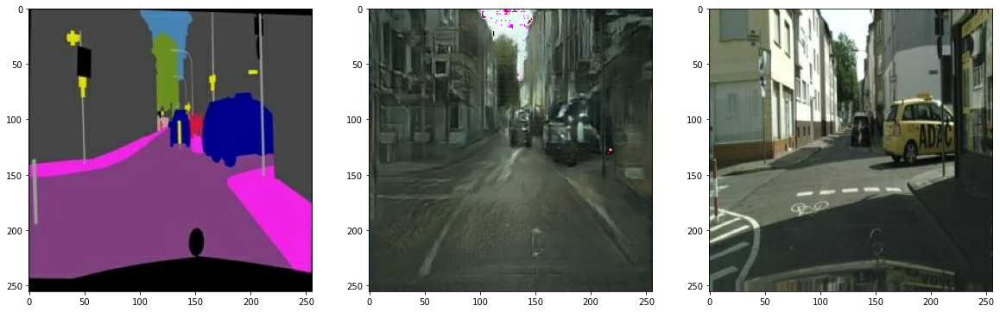

In [35]:
test_ind = 0

f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

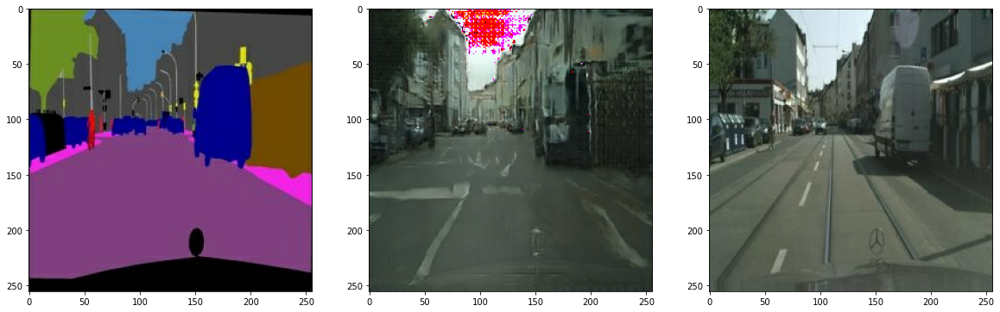

In [36]:
test_ind = 1

f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

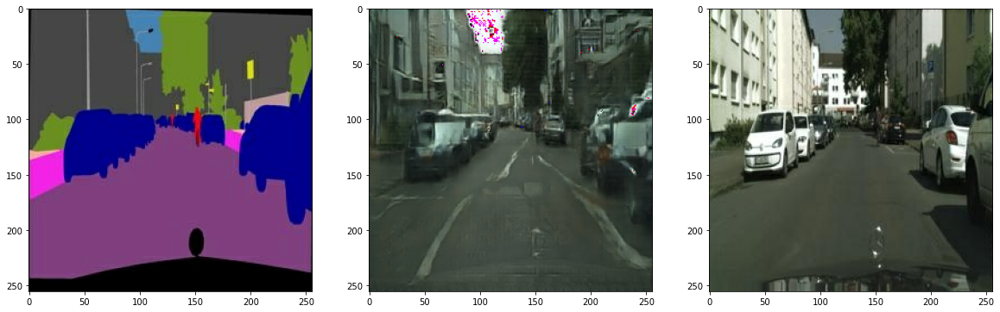

In [37]:
test_ind = 2

f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

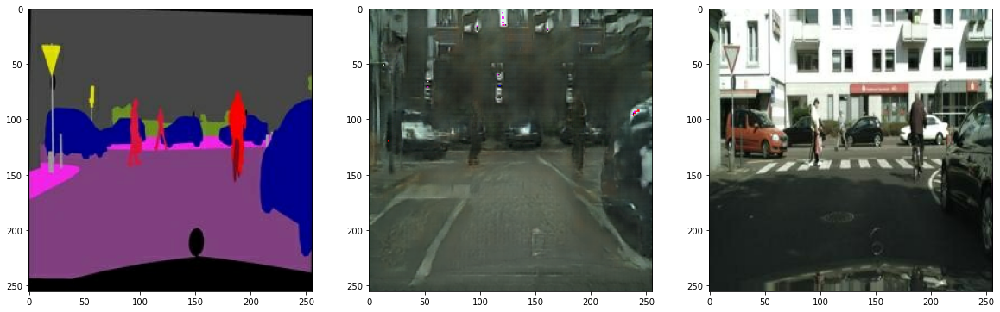

In [38]:
test_ind = 3

f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

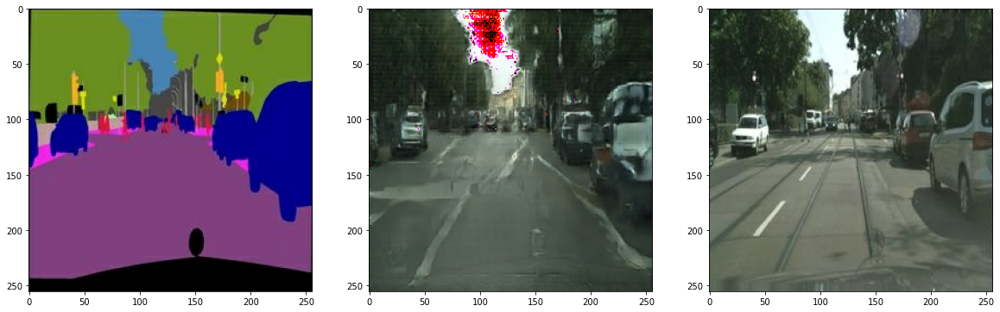

In [39]:
test_ind = 4

f = test_path + os.listdir(test_path)[test_ind]
sketch, colored = load_img(f)

pred = generator(tf.expand_dims(sketch, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.imshow(denormalize(sketch))
plt.subplot(1,3,2); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.imshow(denormalize(colored))

데이터셋을 제공한 출처를 보면, Pix2Pix로 128 epoch 학습 후 테스트 결과가 아래와 같다고 한다.  
이전 10 epoch 학습의 결과보다는 훨씬 낫지만, 조금 오래 학습했어도 채색해야 할 전체적인 색감 정도만 학습되며 아직까지 세부적으로는 제대로 채색되지 않다는 것을 확인할 수 있다.

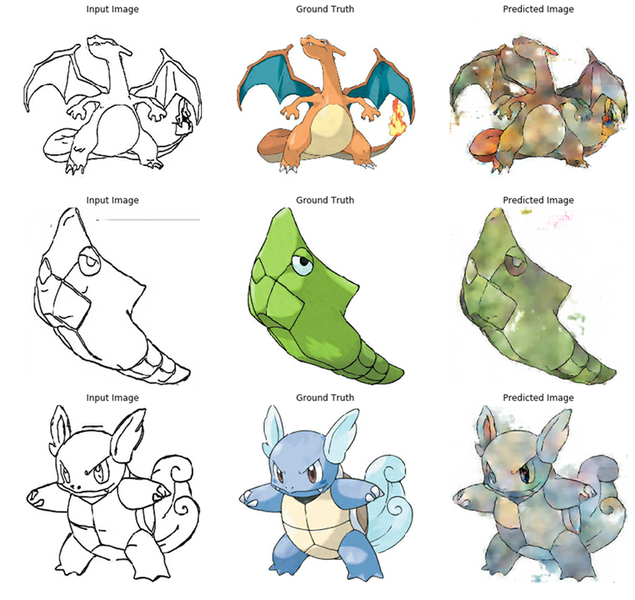

Pix2Pix가 등장한 지 꽤 오랜 시간이 흘렀고 그동안 많은 발전이 있었다. Pix2Pix의 출력 결과가 만족스럽지 않더라도 기술적으로는 의미가 매우 크다. [네이버 AI Painter][1]와 같은 서비스도 Pix2Pix와 같은 시도들이 없었다면 등장할 수 없었을 것이다.

지금까지 꽤 많은 시간을 투자해서 Encoder-Decoder Generator, U-Net Generator, Discriminator의 구현까지 해보았다 앞서 다뤘던 코드의 이해에 큰 어려움이 없었다면, 연습을 통해 이와 비슷한 구조의 모델들 또한 쉽게 구현할 수 있을 것이다. (U-Net Generator를 구현했으니 원래 segmentation에 사용되었던 U-Net도 쉽게 구현할 수 있다!).

이번 학습을 통해서 Pix2Pix 구조뿐만 아니라 CNN 기반의 어떠한 구조라도 자신을 갖고 구현을 시작할 수 있길 바란다.

[1]:https://ai.webtoons.com/painter

## EXPLORATION 17 회고

● 이번 프로젝트에서 어려웠던 점  
이 프로젝트를 시작할 때 개인적으로 약간의 두려움을 가지고 시작했다. 저번 프로젝트인 'GAN_CIFAR_10'에서 원하는 이미지를 만들어내는데 실패했기 때문이다. 하지만 반가움도 있었다. 이번만큼은 이미지를 만들어내보자는 의지가 있었기 때문이다. 

이론 부분에서 어느정도 이해가 됐지만 코드 부분에서는 이해하기 어려운 부분이 있었다. 누군가 코드 부분을 한 줄씩 설명해주었다면 많이 알아갈 수 있었을 것 같다는 생각이 들었다. 다행히 그 누군가 한 분이 (256, 512, 3) 이미지를 두 개의 이미지로 자르는 방법을 그림을 그려가며 설명해 주셨다. 코드를 자세히 뜯어보면 보일 것이라고 하셔서 코드의 의미를 알아내려는 노력을 해보았고, 내 것으로 만들었다(ㄱㅌㅇ님 감사합니다!).

이 프로젝트가 나온 당일에 모델을 학습시키려고 하는데 1 EPOCH당 1시간이라는 시간이 걸렸다. 하지만 최소 10 EPOCH 이상 학습하라고 하여 10시간이 걸리더라도 해보자는 생각으로 진행하였다. 하지만 새벽 중간에 커널이 끊기는 바람에 EPCOH 6에서 멈춰버리고 말았다(왜 눈물이 나지). 아마 모델학습을 시작했던 오후 10시가 GPU가 아니라 CPU로 학습되는 상황이었던 것으로 추정된다. 그래서 1 EPOCH당 1시간이 걸렸던 것 같다. 몇 일 후 다시 학습을 시켜보니 1 EPOCH당 1분 밖에 걸리지 않았다(저번 새벽에 뭐 한거지). 그래서 감히 시도하지 못했던 200 EPCOH 학습을 시도하였고, 그에 걸맞는 이미지를 생성했다(하지만 저번 1 EPOCH당 1시간 학습은 구글 코랩 프로 결제를 하게끔 만들었다).


● 프로젝트를 진행하면서 알아낸 점 혹은 아직 모호한 점  
생성해낸 이미지를 보면 빨간색, 분홍색 부분으로 이루어져 있는 깨진 부분이 있다. 학습이 부족해서 발생한 것인지 코드 어딘가를 고쳐봐야 하는 것인지를 파악을 하지 못했다. 학습시키는 것도 시간상 한계가 있어 이 부분을 알아내지 못한 점이 아쉽다. 학습을 배로 시켜도 완벽히 만들지 못했다는 이야기를 들어보면 학습을 오래 한다고 될 일도 아닌 것으로 추정된다.


● 루브릭 평가 지표를 맞추기 위해 시도한 것들  
학습된 Generator를 이용해 테스트할 때는 다운로드했던 'val' 폴더 내 이미지를 사용해 달라고 하였다. 이를 모르고 당당하게 'train' 폴더 내 이미지를 사용했다가 나중에 'val' 폴더 내 이미지를 사용했다.


● 자기 다짐  
이번에는 이미지를 잘 생성해냈다. 그러한 이유로 약간의 자신감을 가지고 간다. 하지만 완벽히 이미지를 만들어낸 것도 아닐뿐더러 이론과 코드 부분에서 더 많은 이해가 필요하다고 생각한다.

이번 프로젝트는 개인적으로 길었다고 생각되는 EXPLORATION의 마지막이었다(아쉽긴 하지만 다시는 안봤..). 마지막인만큼 살짝 놓고 싶은 마음도 있었으나 끝을 잘 마무리하는 것이 중요하다고 생각하여 나름대로 최선을 다했다. 이제는 다른 공부를 하게 되겠지만 가끔 한 번씩 어떤 것이 부족했는지 마무리한 EXPLORATION들을 돌아보는 것도 중요하다고 생각한다. 나중에 보면 알게 되는 경우가 있기 때문이다.

마지막으로 EXPLORATION 경험을 통해 다른 공부도 잘해보겠다는 의지를 다지며 이상 마친다.